# Projet final du Kit Big Data 2022

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import multiprocessing
from bs4 import BeautifulSoup
from shutil import copyfileobj
from urllib import request
import time
import pylightxl as xl
import glob
import datetime
import re
import warnings
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error as mse, accuracy_score as accuracy
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
warnings.filterwarnings('ignore')

## I - Acquisition et chargement des données

### 1.1. Acquisition des fichiers de classement

In [2]:
def download_excel(url, filename):
    ''' Télécharge le fichier Excel à l`URL donnée, et le stocke dans le fichier filename '''
    with request.urlopen(url) as response, open(filename, 'wb') as out_file:
        copyfileobj(response, out_file)

On remarque que les fichiers Excel contenant la liste des dates de classement sont disponibles sur la page principale du site https://www.vendeeglobe.org/fr/classement, et que le champ `value` des balises `option` contient le nom du fichier Excel de chaque classement. <br>
Pour récupérer l'ensemble des fichiers Excel, il suffit donc de récupérer les noms de fichier dans les tags option, puis de lancer une requête spécifique pour les télécharger.

In [3]:
html = requests.get("https://www.vendeeglobe.org/fr/classement").content.decode('utf-8')
soup = BeautifulSoup(html)
options = soup.findAll("option")
ranking_dates = []
for opt in options:
    if opt["value"]:
        ranking_dates.append(opt["value"])
print(f"{len(ranking_dates)} fichiers de classement trouvés.")

params = [(f"https://www.vendeeglobe.org/download-race-data/vendeeglobe_{date}.xlsx", f"vendeeglobe/{date}.xlsx") for date in ranking_dates]
with multiprocessing.Pool() as p:
    p.starmap(download_excel, params)

706 fichiers de classement trouvés.


Les fichiers ont été téléchargés en local, on cherche à présent à les importer dans deux Dataframe pandas : un pour les skippers encore en course, l'autre pour les skippers ayant déjà franchis la ligne d'arrivée.<br>Xlwings ne fonctionnant pas sur mon ordinateur, j'ai utilisé la library pylightxl pour pouvoir ouvrir les fichiers Excel et importer les données sous pandas.

In [4]:
def extract_running_data(datetime, db, row_start, row_stop):
    running = []
    headers = db.ws(ws="fr").row(row=row_start)[:-1]
    headers = [h.split("\n")[0] for h in headers]
    headers[0:4] = ["datetime", "rank", "Nat/Voile", "Skipper/Bateau"]
    headers[-1:] = ["DTF", "DTL"]
    headers[7:11] = [f"last30m_{h}" for h in headers[7:11]]
    headers[11:15] = [f"lastranking_{h}" for h in headers[11:15]]
    headers[15:19] = [f"last24h_{h}" for h in headers[15:19]]
    running.append(headers)
    for i in range(row_start+1, row_stop):
        skip = db.ws(ws="fr").row(row=i)[1:]
        skip.insert(0, datetime)
        running.append(skip)
    return running

In [5]:
def extract_finished_data(datetime, db, row_stop):
    finished = []
    headers = db.ws(ws="fr").row(row=5)
    headers = [h.split("\n")[0] for h in headers]
    headers[0:6] = ["datetime", "rank", "Nat/Voile", "Skipper/Bateau", "Date d'arrivée", "Temps de course"]
    headers[12:15:2] = [f"gap_{h}" for h in headers[12:15:2]]
    headers[16:18] = [f"ortho_{h}" for h in headers[16:18]]
    headers[18] = "percent"
    headers[19:21] = [f"ground_{h}" for h in headers[19:21]]
    headers = [h for h in headers if h]
    finished.append(headers)
    for i in range(6, row_stop):
        skip = db.ws(ws="fr").row(row=i)[1:]
        skip.insert(0, datetime)
        skip = [skip[idx] for idx in [0, 1, 2, 3, 7, 8, 13, 15, 16, 17, 18, 19, 20]]
        finished.append(skip)
    return finished

In [6]:
def extract_data(file):
    ''' Extracts data from Excel files and stores them into 2 lists of list'''
    with open(file, 'rb') as f:
        datetime = f.name.split(".")[0].split("/")[1]
        db = xl.readxl(f)
    # On compte le nombre de fois où "Rang" apparaît dans la colonne B
    B = db.ws(ws="fr").col(col=2)
    indices = [idx for idx, value in enumerate(B) if value == "Rang\nRank"]
    
    if datetime == "20201108_120200":
        #La course n'a pas encore commencé, aucune information utile dans ce fichier
        return [], []
    
    if len(indices) > 1 :
    # Cas où des skippers ont passé la ligne, mais il y a encore des skippers en course
        # Extract les données sur les skippers encore en course
        row_start = indices[1] + 2
        row_stop = B.index("Traitements et calculs : Géovoile, un service Hauwell Studios", row_start) + 1
        running = extract_running_data(datetime, db, row_start, row_stop)
        # Extract les données sur les skippers déjà arrivés
        finished = extract_finished_data(datetime, db, row_start-1)
    elif datetime == "20210305_080000":
    # Cas où tous les skippers sont arrivés (ou ont abandonné)
        running = []
        finished = extract_finished_data(datetime, db, 39)
    else:
    # Cas où aucun skipper n'a encore franchi la ligne d'arrivée
        finished = []
        running = extract_running_data(datetime, db, 5, 39)

    return finished, running

In [7]:
runnings, arrived = [], []
files = glob.glob("vendeeglobe/*")
for file in files:
    finished, running = extract_data(file)
    if finished:
        dff = pd.DataFrame(finished[1:], columns=finished[0])
        arrived.append(dff)
    if running:
        dfr = pd.DataFrame(running[1:], columns=running[0])
        runnings.append(dfr)

df_running = pd.concat(runnings)
df_finished = pd.concat(arrived)
print(f"Classement pour les skippers encore dans la course")
display(df_running.head())
print(f"Classement pour les skippers ayant franchis la ligne d'arrivée")
display(df_finished.head())

Classement pour les skippers encore dans la course


,datetime,rank,Nat/Voile,Skipper/Bateau,Heure FR,Latitude,Longitude,last30m_Cap,last30m_Vitesse,last30m_VMG,...,lastranking_Cap,lastranking_Vitesse,lastranking_VMG,lastranking_Distance,last24h_Cap,last24h_Vitesse,last24h_VMG,last24h_Distance,DTF,DTL
0,20201230_110000,1,\nFRA 17,Yannick Bestaven\nMaître Coq IV,11:30 FR\n,55°47.17'S,110°11.00'W,78°,16.2 kts,14.5 kts,...,75°,17.1 kts,15.1 kts,51.4 nm,114°,12.1 kts,12.1 kts,290.0 nm,8435.6 nm,0.0 nm
1,20201230_110000,2,\nFRA 79,Charlie Dalin\nAPIVIA,11:30 FR\n,53°47.14'S,112°32.49'W,85°,19.6 kts,17.2 kts,...,82°,21.3 kts,18.0 kts,63.8 nm,85°,15.0 kts,12.8 kts,360.9 nm,8553.0 nm,117.4 nm
2,20201230_110000,3,\nFRA 59,Thomas Ruyant\nLinkedOut,11:30 FR\n,54°12.00'S,114°10.44'W,89°,19.9 kts,18.3 kts,...,85°,19.4 kts,17.4 kts,58.3 nm,92°,15.6 kts,14.5 kts,374.4 nm,8596.2 nm,160.6 nm
3,20201230_110000,4,\nFRA 1000,Damien Seguin\nGroupe APICIL,11:30 FR\n,54°58.86'S,114°41.63'W,90°,17.7 kts,16.8 kts,...,92°,17.3 kts,16.6 kts,51.8 nm,93°,15.4 kts,14.6 kts,369.6 nm,8596.8 nm,161.2 nm
4,20201230_110000,5,\nFRA 01,Jean Le Cam\nYes we Cam !,11:30 FR\n,54°58.66'S,116°27.85'W,95°,9.0 kts,8.8 kts,...,96°,10.1 kts,9.9 kts,30.4 nm,92°,14.0 kts,13.3 kts,336.5 nm,8654.7 nm,219.1 nm


Classement pour les skippers ayant franchis la ligne d'arrivée


,datetime,rank,Nat/Voile,Skipper/Bateau,Date d'arrivée,Temps de course,gap_Au premier,gap_Au précédent,ortho_Vitesse,ortho_Distance,percent,ground_Vitesse,ground_Distance
0,20210226_170000,1\nARV,\nFRA 17,Yannick Bestaven\nMaître Coq IV,28/01/2021 04:19:46 FR,80j 03h 44min 46s\n-10h 15min 00s,,,12.6 kts,24365.7 nm,117.3 %,14.8 kts,28583.8 nm
1,20210226_170000,2\nARV,\nFRA 79,Charlie Dalin\nAPIVIA,27/01/2021 20:35:47 FR,80j 06h 15min 47s\n,02h 31min 01s,02h 31min 01s,12.6 kts,24365.7 nm,119.6 %,15.1 kts,29135.0 nm
2,20210226_170000,3\nARV,\nFRA 18,Louis Burton\nBureau Vallée 2,28/01/2021 00:45:12 FR,80j 10h 25min 12s\n,06h 40min 26s,04h 09min 25s,12.6 kts,24365.7 nm,117.6 %,14.8 kts,28650.0 nm
3,20210226_170000,4\nARV,\nFRA 01,Jean Le Cam\nYes we Cam !,28/01/2021 20:19:55 FR,80j 13h 44min 55s\n-16h 15min 00s,10h 00min 09s,03h 19min 43s,12.5 kts,24365.7 nm,112.9 %,14.1 kts,27501.5 nm
4,20210226_170000,5\nARV,\nMON 10,Boris Herrmann\nSeaexplorer - Yacht Club De Mo...,28/01/2021 11:19:45 FR,80j 14h 59min 45s\n-06h 00min 00s,11h 14min 59s,01h 14min 50s,12.6 kts,24365.7 nm,116.8 %,14.7 kts,28448.5 nm


### 1.2. Acquisition des caractéristiques des bateaux

La page listant les caractéristiques des bateaux est https://www.vendeeglobe.org/fr/glossaire

In [8]:
html = requests.get("https://www.vendeeglobe.org/fr/glossaire").content.decode('utf-8')
soup = BeautifulSoup(html)
boats = []
popups = soup.findAll("div", attrs={"class": "sv-u-1 sv-u-s-1-2 sv-u-m-1-3 sv-u-l-1-6"})
for elem in popups:
    boat = {}
    boat["skipper_name"] = elem.find("span", attrs={"class": "boats-list__skipper-name"}).text
    skipper_id = elem.find_next("div", attrs={"class": "boats-list__popup mfp-hide"})["id"]
    boat["skipper_id"] = skipper_id.split("-")[-1]
    boat["Nom du bateau"] = elem.find_next('h3').text
    spec_list = elem.find_next('ul').find_all('li')
    for spec in spec_list:
        key, value = spec.text.split(":")[:2]
        if " / Assemblage" in value:
            value = value.split("/")[0]
        boat[key.strip()] = value.strip()
    boats.append(boat)
       
df_boats = pd.DataFrame(boats)
df_boats

,skipper_name,skipper_id,Nom du bateau,Numéro de voile,Anciens noms du bateau,Architecte,Chantier,Date de lancement,Longueur,Largeur,Tirant d'eau,Déplacement (poids),Nombre de dérives,Hauteur mât,Voile quille,Surface de voiles au près,Surface de voiles au portant
0,Fabrice AMEDEO,93,NEWREST - ART & FENÊTRES,FRA 56,"No Way Back, Vento di Sardegna",VPLP/Verdier,Persico Marine,01 Août 2015,"18,28 m","5,85 m","4,50 m",7 t,foils,29 m,monotype,320 m2,570 m2
1,Romain ATTANASIO,110,PURE - Best Western®,FRA 49,"Gitana Eighty, Synerciel, Newrest-Matmut",Bruce Farr Design,Southern Ocean Marine (Nouvelle Zélande),08 Mars 2007,"18,28m","5,80m","4,50m",9t,2,28m,acier forgé,280 m2,560 m2
2,Alexia BARRIER,100,TSE - 4MYPLANET,FRA72,"Famille Mary-Etamine du Lys, Initiatives Coeur...",Marc Lombard,MAG France,01 Mars 1998,"18,28m","5,54m","4,50m",9t,2,29 m,acier,260 m2,580 m2
3,Yannick BESTAVEN,91,Maître CoQ IV,17,Safran 2 - Des Voiles et Vous,Verdier - VPLP,CDK Technologies,12 Mars 2015,"18,28 m","5,80 m","4,50 m",8 t,foils,29 m,acier mécano soudé,310 m2,550 m2
4,Jérémie BEYOU,103,CHARAL,08,NaN,VPLP,CDK Technologies,18 Août 2018,"18,28 m","5,85 m","4,50 m",8t,foils,29 m,acier,320 m2,600 m2
5,Arnaud BOISSIÈRES,88,LA MIE CÂLINE - ARTISANS ARTIPÔLE,FRA 14,"Ecover3, Président, Gamesa, Kilcullen Voyager-...",Owen Clarke Design LLP - Clay Oliver,Hakes Marine - Mer Agitée,03 Août 2007,"18,28 m","5,65 m","4,50 m","7,9 tonnes",foils,29 m,basculante avec vérin,300 m²,610 m²
6,Louis BURTON,106,BUREAU VALLEE 2,18,Banque Populaire VIII,Verdier - VPLP,CDK Technologies,09 Juin 2015,"18,28 m","5,80 m","4,50 m","7,6 t",foils,28 m,acier,300 m2,600 m2
7,Didac COSTA,123,ONE PLANET ONE OCEAN,ESP 33,Kingfisher - Educacion sin Fronteras - Forum M...,Owen Clarke Design,Martens Yachts,02 Février 2000,"18,28 m","5,30 m","4,50 m","8,9 t",2,26 m,acier,240 m2,470 m2
8,Manuel COUSIN,92,GROUPE SÉTIN,FRA 71,"Paprec-Virbac2, Estrella Damm, We are Water, L...",Bruce Farr Yacht Design,Southern Ocean Marine (Nouvelle-Zélande),02 Février 2007,"18,28 m","5,80 m","4,50 m",9 t,2 asymétriques,"28,50",basculante sur vérin hydraulique,270 m2,560 m2
9,Clarisse CREMER,95,BANQUE POPULAIRE X,FRA30,Macif - SMA,Verdier - VPLP,CDK - Mer Agitée,01 Mars 2011,"18,28 m","5,70 m","4,5 m","7,7 t",2,29 m,acier forgé,340 m2,570 m2


## II - Préparation des données 

### 2.1. Nettoyage des données de classement

In [9]:
def clean_ranking_running(df):
    # Formattage des dates
    df["datetime"] =  pd.to_datetime(df["datetime"], format="%Y%m%d_%H%M00")

    # Convertit le rang en chiffre pour pouvoir faire des moyennes dessus
    # Les valeurs non numériques pour les abandons / retards au départ sont converties en Nan
    df["rank"] = pd.to_numeric(df['rank'], errors="coerce").astype(float)
    
    # Séparation des nationalités et voiles
    # Le champ Nationalité est presque toujours vide et non utile, il n'est pas gardé
    df.insert(3, "Voile", df['Nat/Voile'].apply(lambda x: x.split("\n")[1]))

    # Séparation des skippers et bateaux
    df.insert(4, "Skipper", df['Skipper/Bateau'].apply(lambda x: x.split("\n")[0]))
    df.insert(5, "Bateau", df['Skipper/Bateau'].apply(lambda x: x.split("\n")[1]))
    df.drop(columns=['Nat/Voile', 'Skipper/Bateau', 'Heure FR'], inplace=True)

    # Conversion des coordonnées en valeurs décimales
    def convert_degrees(s):
        if s != "":
            degrees = re.split('[°\']', s)
            return (float(degrees[0]) + (float(degrees[1])/60)) * (-1 if degrees[2] == 'S' or degrees[2] == 'W' else 1)   
    df['Latitude'] = df['Latitude'].apply(convert_degrees)
    df['Longitude'] = df['Longitude'].apply(convert_degrees)

    # Conversion des grandeurs physiques en nombres
    for col in ['last30m_Cap', 'lastranking_Cap', 'last24h_Cap']:
        df[col] = df[col].astype(str).str[:-1].astype(float, errors="ignore")
    for col in ['last30m_Vitesse', 'lastranking_Vitesse', 'last24h_Vitesse',
                'last30m_VMG', 'lastranking_VMG', 'last24h_VMG',
                'last30m_Distance', 'lastranking_Distance', 'last24h_Distance',
                'DTF', 'DTL']:
        #df[col] = df[col].apply(lambda x: x.split(' ')[0]).astype(float, errors="ignore")
        df[col] = pd.to_numeric(df[col].apply(lambda x: x.split(' ')[0]), errors="coerce").astype(float)
    
    # Tri par ordre de dates et rang
    df = df.sort_values(by=["datetime", "rank"], ascending=[True,True], axis=0, ignore_index=True)
    
    return df    

In [10]:
df_running = clean_ranking_running(df_running)
df_running

,datetime,rank,Voile,Skipper,Bateau,Latitude,Longitude,last30m_Cap,last30m_Vitesse,last30m_VMG,...,lastranking_Cap,lastranking_Vitesse,lastranking_VMG,lastranking_Distance,last24h_Cap,last24h_Vitesse,last24h_VMG,last24h_Distance,DTF,DTL
0,2020-11-08 14:00:00,1.0,FRA 18,Louis Burton,Bureau Vallée 2,46.407667,-1.841333,241,17.7,17.5,...,357,0.0,0.0,2788.0,201,0.3,0.3,6.1,24293.9,0.0
1,2020-11-08 14:00:00,2.0,MON 10,Boris Herrmann,Seaexplorer - Yacht Club De Monaco,46.405667,-1.830333,241,11.1,10.9,...,357,0.0,0.0,2787.9,196,0.3,0.2,6.0,24294.2,0.4
2,2020-11-08 14:00:00,3.0,FRA 8,Jérémie Beyou,Charal,46.415167,-1.833167,244,15.5,15.5,...,357,0.0,0.0,2788.5,199,0.2,0.2,5.5,24294.3,0.5
3,2020-11-08 14:00:00,4.0,FRA 59,Thomas Ruyant,LinkedOut,46.411833,-1.828000,244,13.2,13.1,...,357,0.0,0.0,2788.3,196,0.2,0.2,5.6,24294.5,0.6
4,2020-11-08 14:00:00,5.0,FRA 53,Maxime Sorel,V And B Mayenne,46.409833,-1.826000,246,10.9,10.9,...,357,0.0,0.0,2788.1,195,0.8,0.7,5.8,24294.5,0.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19222,2021-03-05 04:00:00,NaN,FRA 109,Samantha Davies,Initiatives - Coeur,NaN,NaN,,NaN,NaN,...,,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN
19223,2021-03-05 04:00:00,NaN,FRA 4,Sébastien Simon,ARKEA PAPREC,NaN,NaN,,NaN,NaN,...,,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN
19224,2021-03-05 04:00:00,NaN,GBR 99,Alex Thomson,HUGO BOSS,NaN,NaN,,NaN,NaN,...,,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN
19225,2021-03-05 04:00:00,NaN,FRA 85,Kevin Escoffier,PRB,NaN,NaN,,NaN,NaN,...,,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN


In [11]:
def clean_ranking_finished(df):
    # Formattage des dates
    df["datetime"] =  pd.to_datetime(df["datetime"], format="%Y%m%d_%H%M00")
    df["Date d'arrivée"] = df["Date d'arrivée"].apply(lambda x: pd.to_datetime(x.split(" FR")[0], format="%d/%m/%Y %H:%M:%S") if x!= "" else x)
    df["Temps de course"] = df["Temps de course"].apply(lambda x: x.split("\n")[0] if "\n" in x else x)

    # Séparation des rangs et statuts
    df.insert(1, "Rang", pd.to_numeric(df['rank'].apply(lambda x: x.split("\n")[0]), errors="coerce").astype(float))
    df.insert(2, "Statut", df['rank'].apply(lambda x: x.split("\n")[1] if "\n" in x else x))
    
    # Séparation des nationalités et voiles
    # Le champ Nationalité est presque toujours vide et non utile, il n'est pas gardé
    df.insert(3, "Voile", df['Nat/Voile'].apply(lambda x: x.split("\n")[1]))

    # Séparation des skippers et bateaux
    df.insert(4, "Skipper", df['Skipper/Bateau'].apply(lambda x: x.split("\n")[0]))
    df.insert(5, "Bateau", df['Skipper/Bateau'].apply(lambda x: x.split("\n")[1]))
    df.drop(columns=['rank', 'Nat/Voile', 'Skipper/Bateau'], inplace=True)

    # Conversion des grandeurs physiques en nombres
    for col in ['ortho_Vitesse', 'ortho_Distance', 'percent', 'ground_Vitesse', 'ground_Distance']:
        #df[col] = df[col].apply(lambda x: x.split(' ')[0]).astype(float, errors='ignore')
        df[col] = pd.to_numeric(df[col].apply(lambda x: x.split(' ')[0]), errors="coerce").astype(float)
    
    # Tri par ordre de dates et rang
    df = df.sort_values(by=["datetime", "Rang"], ascending=[True,True], axis=0, ignore_index=True)
    
    return df   

In [12]:
df_finished = clean_ranking_finished(df_finished)
df_finished

,datetime,Rang,Statut,Voile,Skipper,Bateau,Date d'arrivée,Temps de course,gap_Au premier,gap_Au précédent,ortho_Vitesse,ortho_Distance,percent,ground_Vitesse,ground_Distance
0,2021-01-27 17:00:00,1.0,ARV,FRA 79,Charlie Dalin,APIVIA,2021-01-27 21:35:47,80j 06h 15min 47s,,,12.6,24355.0,119.6,15.1,29135.0
1,2021-01-27 21:00:00,1.0,ARV,FRA 17,Yannick Bestaven,Maître Coq IV,2021-01-28 05:19:46,80j 03h 44min 46s,,,12.6,24365.7,117.3,14.8,28583.8
2,2021-01-27 21:00:00,2.0,ARV,FRA 79,Charlie Dalin,APIVIA,2021-01-27 21:35:47,80j 06h 15min 47s,02h 31min 01s,02h 31min 01s,12.6,24365.7,119.6,15.1,29135.0
3,2021-01-27 21:00:00,3.0,ARV,FRA 18,Louis Burton,Bureau Vallée 2,2021-01-28 01:45:12,80j 10h 25min 12s,06h 40min 26s,04h 09min 25s,12.6,24365.7,117.6,14.8,28650.0
4,2021-01-28 04:00:00,1.0,ARV,FRA 17,Yannick Bestaven,Maître Coq IV,2021-01-28 05:19:46,80j 03h 44min 46s,,,12.6,24365.7,117.3,14.8,28583.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3934,2021-03-05 08:00:00,NaN,RET,FRA 109,Samantha Davies,Initiatives - Coeur,NaT,,,,NaN,NaN,NaN,NaN,NaN
3935,2021-03-05 08:00:00,NaN,RET,FRA 4,Sébastien Simon,ARKEA PAPREC,NaT,,,,NaN,NaN,NaN,NaN,NaN
3936,2021-03-05 08:00:00,NaN,RET,GBR 99,Alex Thomson,HUGO BOSS,NaT,,,,NaN,NaN,NaN,NaN,NaN
3937,2021-03-05 08:00:00,NaN,RET,FRA 85,Kevin Escoffier,PRB,NaT,,,,NaN,NaN,NaN,NaN,NaN


### 2.2. Nettoyage des caractéristiques des bateaux

Les noms des skippers ne sont pas orthographiés de la même manière entre les données de classement et de bateau. On les extrait des données de classement pour faire un mapping dessus dans la table des bateaux

In [13]:
skippers = df_finished["Skipper"].unique().tolist()
first_names = [name.split(" ")[0] for name in skippers]
names, counts = np.unique(first_names, return_counts=True)
print(f"Prénoms en double : {names[np.where(counts > 1)][0]}")

Prénoms en double : Sébastien


Seul le prénom Sébastien est en double, se baser sur les prénoms pour faire le mapping devrait donc se faire sans trop de problèmes.

Dans le dataframe des bateaux, un des bateaux n'a pas de numéro de voile. Peut-être peut-on le récupérer depuis le dataframe des classements

In [14]:
voiles = df_finished[["Skipper", "Voile"]]
voiles[voiles["Skipper"]=="Thomas Ruyant"].iloc[0]

Skipper    Thomas Ruyant
Voile             FRA 59
Name: 7, dtype: object

Le numéro de voile correspondant est donc FRA 59

Certains Nan sont présents dans des champs non utiles (ex: Anciens noms du bateau), ils ne sont donc pas nettoyés explicitement.

In [15]:
def clean_boats_features(df_boats, skipper_mapping):
    # Drop François Guiffant (seulement un nom, aucune caractéristique de bateau, n'intervient pas dans la course)
    df_boats = df_boats.drop(16).reset_index(drop=True)
    
    # Conversion des grandeurs physiques en nombres
    for col in ['Longueur', 'Largeur', 'Tirant d\'eau', 'Déplacement (poids)', 'Hauteur mât', 'Surface de voiles au près', 'Surface de voiles au portant']:
        df_boats[col] = df_boats[col].apply(lambda x: re.sub(' ?[A-Za-z]+[2²]?', '', x).replace(',', '.')).astype(float, errors='ignore')
    
    # Mapping des noms avec ceux des données de classement pour merge
    mapping = {}
    skippers = df_boats["skipper_name"].unique().tolist()
    for skip in skippers:
        if skip == "Sébastien DESTREMAU":
            mapping[skip] = "Sébastien Destremau"
        elif skip == "Sébastien SIMON":
            mapping[skip] = "Sébastien Simon"
        elif skip == "Sam DAVIES":
            mapping[skip] = "Samantha Davies"
        else:
            mapping[skip] = [name for name in skipper_mapping if name.split(" ")[0] == skip.split(" ")[0]][0]
    df_boats["skipper_name"] = df_boats["skipper_name"].map(mapping)
    df_boats[df_boats["skipper_name"] == "Thomas Ruyant"]["Numéro de voile"] = "FRA 59"
    
    # Fix foils bateau SIMON
    df_boats = df_boats.replace("foiler", "foils")
    
    return df_boats

In [16]:
df_boats = clean_boats_features(df_boats, skippers)
df_boats

,skipper_name,skipper_id,Nom du bateau,Numéro de voile,Anciens noms du bateau,Architecte,Chantier,Date de lancement,Longueur,Largeur,Tirant d'eau,Déplacement (poids),Nombre de dérives,Hauteur mât,Voile quille,Surface de voiles au près,Surface de voiles au portant
0,Fabrice Amedeo,93,NEWREST - ART & FENÊTRES,FRA 56,"No Way Back, Vento di Sardegna",VPLP/Verdier,Persico Marine,01 Août 2015,18.28,5.85,4.5,7,foils,29.0,monotype,320.0,570.0
1,Romain Attanasio,110,PURE - Best Western®,FRA 49,"Gitana Eighty, Synerciel, Newrest-Matmut",Bruce Farr Design,Southern Ocean Marine (Nouvelle Zélande),08 Mars 2007,18.28,5.80,4.5,9,2,28.0,acier forgé,280.0,560.0
2,Alexia Barrier,100,TSE - 4MYPLANET,FRA72,"Famille Mary-Etamine du Lys, Initiatives Coeur...",Marc Lombard,MAG France,01 Mars 1998,18.28,5.54,4.5,9,2,29.0,acier,260.0,580.0
3,Yannick Bestaven,91,Maître CoQ IV,17,Safran 2 - Des Voiles et Vous,Verdier - VPLP,CDK Technologies,12 Mars 2015,18.28,5.80,4.5,8,foils,29.0,acier mécano soudé,310.0,550.0
4,Jérémie Beyou,103,CHARAL,08,NaN,VPLP,CDK Technologies,18 Août 2018,18.28,5.85,4.5,8,foils,29.0,acier,320.0,600.0
5,Arnaud Boissieres,88,LA MIE CÂLINE - ARTISANS ARTIPÔLE,FRA 14,"Ecover3, Président, Gamesa, Kilcullen Voyager-...",Owen Clarke Design LLP - Clay Oliver,Hakes Marine - Mer Agitée,03 Août 2007,18.28,5.65,4.5,7.9,foils,29.0,basculante avec vérin,300.0,610.0
6,Louis Burton,106,BUREAU VALLEE 2,18,Banque Populaire VIII,Verdier - VPLP,CDK Technologies,09 Juin 2015,18.28,5.80,4.5,7.6,foils,28.0,acier,300.0,600.0
7,Didac Costa,123,ONE PLANET ONE OCEAN,ESP 33,Kingfisher - Educacion sin Fronteras - Forum M...,Owen Clarke Design,Martens Yachts,02 Février 2000,18.28,5.30,4.5,8.9,2,26.0,acier,240.0,470.0
8,Manuel Cousin,92,GROUPE SÉTIN,FRA 71,"Paprec-Virbac2, Estrella Damm, We are Water, L...",Bruce Farr Yacht Design,Southern Ocean Marine (Nouvelle-Zélande),02 Février 2007,18.28,5.80,4.5,9,2 asymétriques,28.5,basculante sur vérin hydraulique,270.0,560.0
9,Clarisse Cremer,95,BANQUE POPULAIRE X,FRA30,Macif - SMA,Verdier - VPLP,CDK - Mer Agitée,01 Mars 2011,18.28,5.70,4.5,7.7,2,29.0,acier forgé,340.0,570.0


### 2.3. Rapprochement des données des voiliers avec celle des classements

Nous pouvons à présent combiner les dataframes des caractéristiques de bateau et de classement grâce au nom de skipper.

In [17]:
merge_df = pd.merge(left=df_running, right=df_boats, left_on="Skipper", right_on="skipper_name", how="left")
merge_df.drop(columns=['skipper_name', "Bateau"], inplace=True)
merge_df

,datetime,rank,Voile,Skipper,Latitude,Longitude,last30m_Cap,last30m_Vitesse,last30m_VMG,last30m_Distance,...,Date de lancement,Longueur,Largeur,Tirant d'eau,Déplacement (poids),Nombre de dérives,Hauteur mât,Voile quille,Surface de voiles au près,Surface de voiles au portant
0,2020-11-08 14:00:00,1.0,FRA 18,Louis Burton,46.407667,-1.841333,241,17.7,17.5,0.3,...,09 Juin 2015,18.28,5.80,4.5,7.6,foils,28.0,acier,300.0,600.0
1,2020-11-08 14:00:00,2.0,MON 10,Boris Herrmann,46.405667,-1.830333,241,11.1,10.9,0.4,...,07 Août 2015,18.28,5.70,4.5,7.6,foils,29.0,acier,290.0,490.0
2,2020-11-08 14:00:00,3.0,FRA 8,Jérémie Beyou,46.415167,-1.833167,244,15.5,15.5,0.5,...,18 Août 2018,18.28,5.85,4.5,8,foils,29.0,acier,320.0,600.0
3,2020-11-08 14:00:00,4.0,FRA 59,Thomas Ruyant,46.411833,-1.828000,244,13.2,13.1,0.7,...,03 Septembre 2019,18.28,5.85,4.5,8,foils,29.0,acier forgé,350.0,560.0
4,2020-11-08 14:00:00,5.0,FRA 53,Maxime Sorel,46.409833,-1.826000,246,10.9,10.9,0.2,...,07 Septembre 2007,18.28,5.50,4.5,7.7,2,29.0,acier,365.0,700.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19222,2021-03-05 04:00:00,NaN,FRA 109,Samantha Davies,NaN,NaN,,NaN,NaN,NaN,...,20 Septembre 2010,18.28,5.70,4.5,7.8,foils,27.0,acier forgé,300.0,600.0
19223,2021-03-05 04:00:00,NaN,FRA 4,Sébastien Simon,NaN,NaN,,NaN,NaN,NaN,...,19 Juillet 2019,18.28,5.70,4.5,8,foils,29.0,Inox usiné,260.0,600.0
19224,2021-03-05 04:00:00,NaN,GBR 99,Alex Thomson,NaN,NaN,,NaN,NaN,NaN,...,15 Août 2019,18.28,5.40,4.5,7.7,foils,29.0,acier forgé,330.0,630.0
19225,2021-03-05 04:00:00,NaN,FRA 85,Kevin Escoffier,NaN,NaN,,NaN,NaN,NaN,...,08 Mars 2010,18.28,5.50,4.5,,foils,27.4,Acier mécano soudé,300.0,600.0


## III - Analyses et story telling

### 3.1. Visualisation du classement final

Il est possible d'afficher le classement final en récupérant les 33 dernières lignes du dataframe contenant les skipper ayant franchi la ligne d'arrivée. Les rang affichés en `Nan` correspondent aux abandons. <br>
<u>N.B.</u> : Le classement final ne correspond pas exactement à l'ordre d'arrivée des skippers, certains temps de compensation ayant été accordés.

In [18]:
final_rank = df_finished[-33:][["Date d'arrivée", "Rang", "Skipper"]].reset_index(drop=True)
final_rank

,Date d'arrivée,Rang,Skipper
0,2021-01-28 04:19:46,1.0,Yannick Bestaven
1,2021-01-27 20:35:47,2.0,Charlie Dalin
2,2021-01-28 00:45:12,3.0,Louis Burton
3,2021-01-28 20:19:55,4.0,Jean Le Cam
4,2021-01-28 11:19:45,5.0,Boris Herrmann
5,2021-01-28 05:42:01,6.0,Thomas Ruyant
6,2021-01-28 12:18:20,7.0,Damien Seguin
7,2021-01-28 13:02:20,8.0,Giancarlo Pedote
8,2021-01-29 10:05:20,9.0,Benjamin Dutreux
9,2021-01-30 04:50:15,10.0,Maxime Sorel


### 3.2. Route des voiliers

A partir des données récupérées, il est à présent possible d'afficher la route de chacun des voiliers pendant la course.

In [19]:
fig = go.Figure()

df_skippers = []
for skipper in df_running["Skipper"].unique():
    df_skippers.append(df_running[df_running["Skipper"] == skipper])
for df in df_skippers:
    fig = fig.add_trace(go.Scattergeo(        
        lon = df['Longitude'],
        lat = df['Latitude'],
        text = df['datetime'].astype('str') + " : Classement " + df['rank'].astype('str'),
        mode="lines",
        name=df["Skipper"].unique()[0]))
fig.update_geos(projection_type="azimuthal equal area", fitbounds="locations")
fig.update_layout(height=600, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Cet affichage permet notamment de repérer l'abandon de certains skippers (Sébastien Destremeau qui s'arrête en Nouvelle-Zélande, Alex Thomson et Samantha Davies qui s'arrêtent au Cap de Bonne-Espérance, etc.)

En zoomant au sud du Cap de Bonne-Espérance, il est également possible d'observer le changement de cap de Yannick Bestaven (en bleu ci-dessou), qui a modifié sa trajectoire pour porter assistance à Kevin Escoffier (en rouge ci-dessous). <br>
Par comparaison, Charlie Davin (en cyan) a maintenu son cap et terminé la course avant Yannick Bestaven. Un temps de compensation a par la suite été accordé à Yannick Bestaven pour le sauvetage, ce qui lui a permis de terminer 1er au classement.

In [20]:
fig = go.Figure()
df_skippers_shortlist = []
for skipper in ["Yannick Bestaven", "Kevin Escoffier", "Charlie Dalin"]:
    df_skippers_shortlist.append(df_running[df_running["Skipper"] == skipper])
for df in df_skippers_shortlist:
    fig = fig.add_trace(go.Scattergeo(        
        lon = df['Longitude'],
        lat = df['Latitude'],
        text = df['datetime'].astype('str') + " : Classement " + df['rank'].astype('str'),
        mode="lines",
        name=df["Skipper"].unique()[0]))
fig.update_geos(projection_type="natural earth", center=dict(lat=-41, lon=9), projection_scale=2.5)
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Il est également possible de visualiser les différences d'optimisation du trajet de chaque skipper. Sur la carte ci-dessous, on peut observer qu'Alan Roura (en cyan ci-dessou) a énormément dévié vers le continent américain sur le retour, et a donc parcouru beaucoup une distance total beaucoup plus importante que Maxime Sorel (en rouge ci-dessou) par exemple.

In [21]:
fig = go.Figure()
df_skippers_shortlist = []
for skipper in ["Charlie Dalin", "Maxime Sorel", "Alan Roura"]:
    df_skippers_shortlist.append(df_running[df_running["Skipper"] == skipper])
for df in df_skippers_shortlist:
    fig = fig.add_trace(go.Scattergeo(        
        lon = df['Longitude'],
        lat = df['Latitude'],
        text = df['datetime'].astype('str') + " : Classement " + df['rank'].astype('str'),
        mode="lines",
        name=df["Skipper"].unique()[0]))
fig.update_geos(projection_type="natural earth", fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### 3.3. Evolution du classement

A partir des données des skippers encore en course, il est également possible de visualiser l'évolution du classement des skippers, ainsi que les dates des abandons. On remarque une grande variabilité des classements en début de course, mais la liste des skippers faisant partie du top 10 semble déjà être déterminée à partir du premier mois de course.

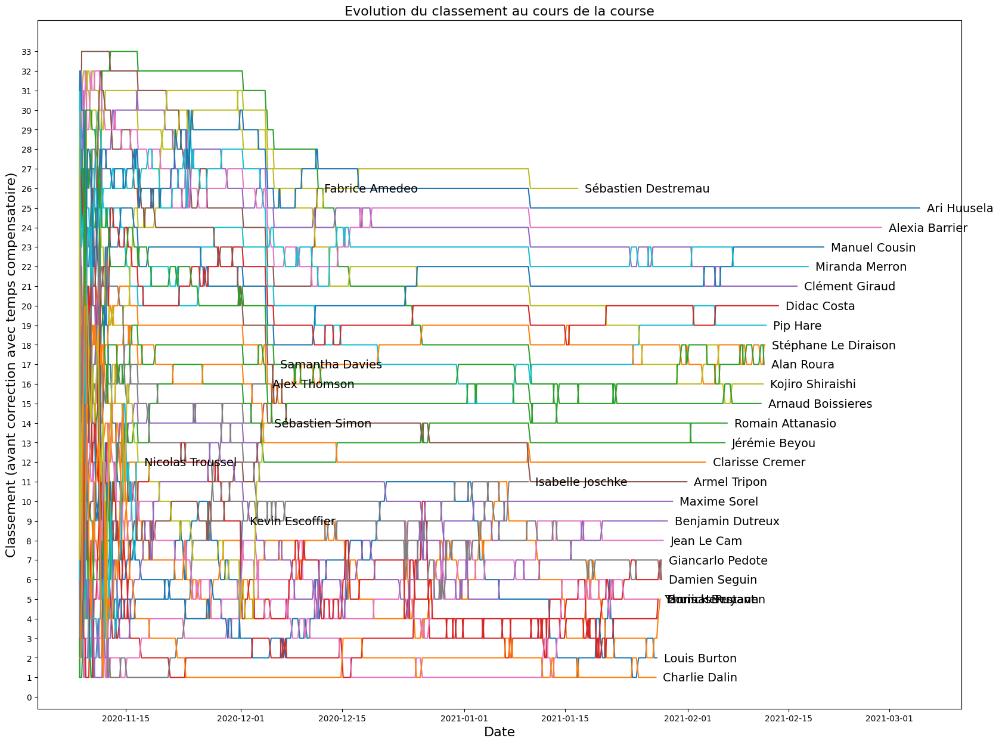

In [22]:
plt.figure(figsize=(20, 15))
for df in df_skippers:
    df = df.dropna()
    plt.plot(df["datetime"], df["rank"])
    plt.text(df.iloc[-1]["datetime"] + pd.Timedelta(days=1), df.iloc[-1]["rank"]-0.2,
             df["Skipper"].tolist()[0], fontsize=14)

plt.title('Evolution du classement au cours de la course', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Classement (avant correction avec temps compensatoire)', fontsize=16)
plt.yticks(range(34))
plt.show()

### 3.4. Distance parcourue par voilier

Il est également intéressant de regarder la distance totale parcourue par chaque skipper au long de la course.

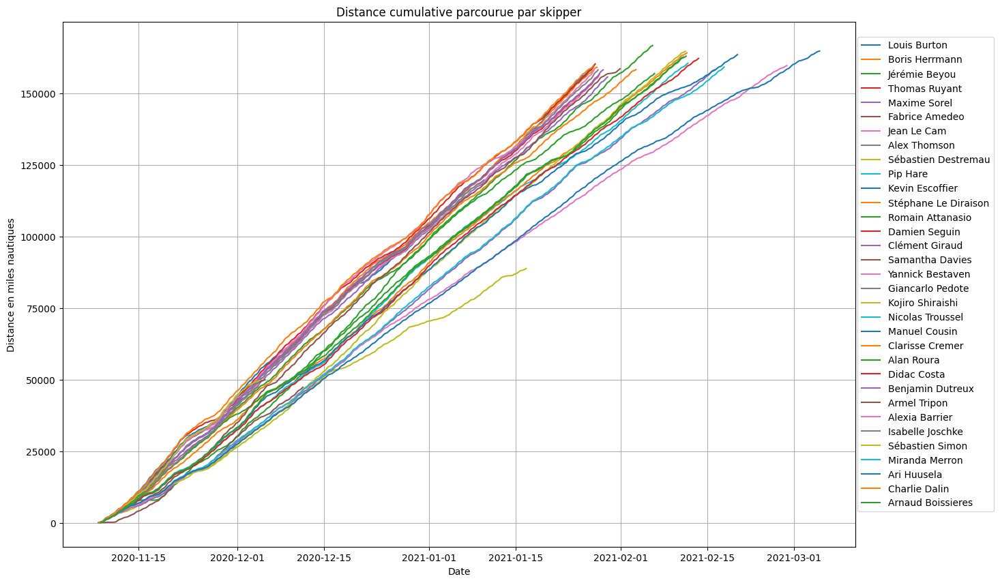

In [23]:
plt.figure(figsize=(15, 10))
for df in df_skippers:
    plt.plot(df["datetime"], df["last24h_Distance"].cumsum(), label=df["Skipper"].tolist()[0])

plt.legend(bbox_to_anchor=(1.18,0.98))
plt.grid(True, 'major', 'both')
plt.title('Distance cumulative parcourue par skipper')
plt.xlabel('Date')
plt.ylabel('Distance en miles nautiques')
plt.show()

On retrouve bien les observations faites sur la dernière carte présentée plus haut, à savoir que certains skippers comme Alan Roura ont parcouru des distances beaucoup plus importantes pour arriver à la ligne d'arrivée (ce qui impacte logiquement leur classement).

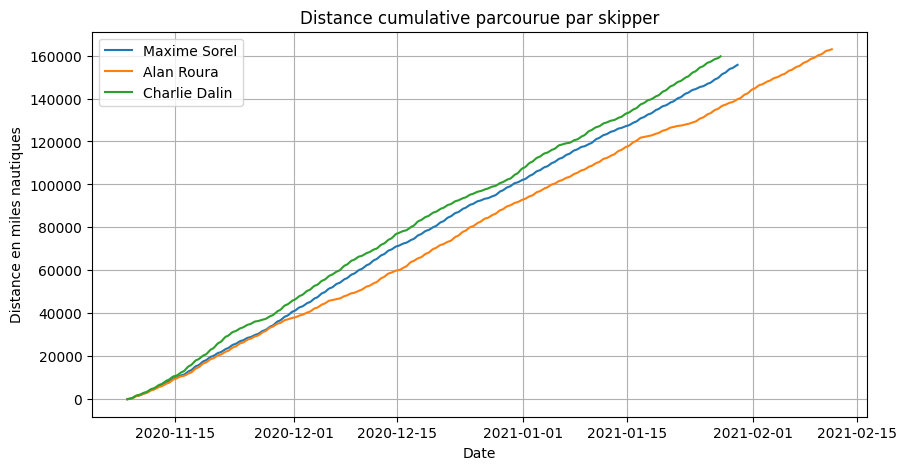

In [24]:
plt.figure(figsize=(10, 5))
for df in df_skippers:
    if df["Skipper"].tolist()[0] in ["Charlie Dalin", "Maxime Sorel", "Alan Roura"]:
        plt.plot(df["datetime"], df["last24h_Distance"].cumsum(), label=df["Skipper"].tolist()[0])

plt.legend()
plt.grid(True, 'major', 'both')
plt.title('Distance cumulative parcourue par skipper')
plt.xlabel('Date')
plt.ylabel('Distance en miles nautiques')
plt.show()

### 3.5. Analyse des performances

Après ces premières observations, il est à présent intéressant de se pencher sur les facteurs impactant le plus le classement final. On étudiera l'impact de la vitesse utile (VMG) des voiliers, et l'impact de la présence de foils sur le classement.

#### 3.5.1. Corrélation et régression linéaire entre le classement (rang) et la vitesse utile (VMG) des voiliers.

On calcule la VMG moyenne pour chaque skipper à partir des données relevées toutes les 24h pour effectuer une régression linéaire entre le classement et la VMG. Les données de VMG fournies par classement ne sont pas utilisées, car elles ne sont pas obtenues à des intervalles de temps constants.

In [25]:
df_moyennes = df_running.groupby("Skipper").mean()
df_moyennes.drop(columns=["Latitude", "Longitude", "last30m_Vitesse", "last30m_VMG", "last30m_Distance",
                          "last30m_Vitesse", "lastranking_Vitesse", "lastranking_VMG", "lastranking_Distance",
                          "lastranking_Vitesse"], inplace=True)
df_moyennes.rename(columns={"last24h_Vitesse": "Vitesse Moyenne", "last24h_VMG": "VMG Moyenne", "last24h_Distance":"Distance Moyenne", "rank": "Classement moyen"}, inplace=True)
df_moyennes

,Classement moyen,Vitesse Moyenne,VMG Moyenne,Distance Moyenne,DTF,DTL
Skipper,,,,,,
Alan Roura,16.466783,11.870455,10.641608,284.864510,12010.866608,1805.306294
Alex Thomson,7.461538,12.698718,10.966667,304.442949,20795.096154,336.194231
Alexia Barrier,24.819403,9.940000,9.077015,238.259403,12213.304627,3417.251493
Ari Huusela,25.955777,9.788873,8.673752,234.952211,11909.323966,3480.116262
Armel Tripon,16.076772,13.003150,11.930118,312.056496,12658.633268,1227.416929
Arnaud Boissieres,17.452297,11.969788,10.724558,287.263604,12175.901060,1990.906890
Benjamin Dutreux,7.572301,13.424644,12.376986,322.044196,12213.708758,397.569857
Boris Herrmann,6.921649,13.664124,12.542268,327.923093,12291.379588,330.507629
Charlie Dalin,2.286902,13.828898,12.604990,331.893971,12072.658004,63.314137


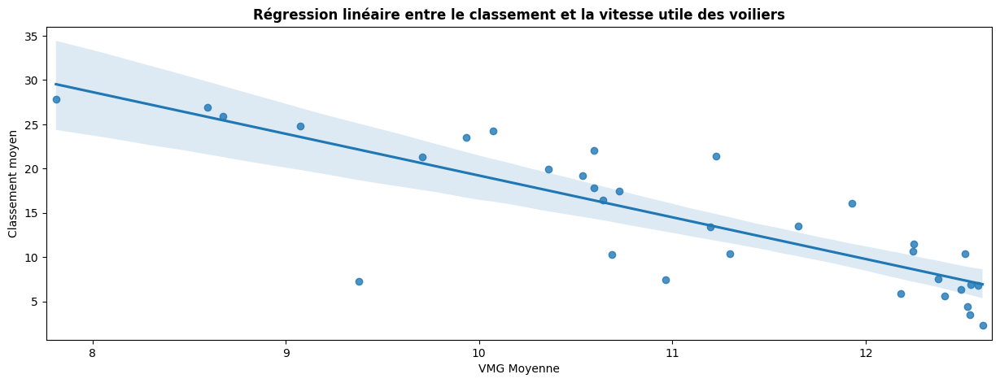

In [26]:
plt.figure(figsize=(15, 5))
linreg = sns.regplot(x = "VMG Moyenne", y = "Classement moyen", data = df_moyennes)
plt.title("Régression linéaire entre le classement et la vitesse utile des voiliers", fontweight='bold')
plt.xlim([df_moyennes["VMG Moyenne"].min()-0.05, df_moyennes["VMG Moyenne"].max()+0.05])
plt.show()

Les paramètres de cette droite de régression sont les suivants :

In [27]:
slope, intercept, r_value, p_value, std_err =  stats.linregress(x=linreg.get_lines()[0].get_xdata(),y=linreg.get_lines()[0].get_ydata())
reg = pd.DataFrame(columns=["Pente", "Ordonnée à l'origine", "r_value", "p_value", "Ecart-type"])
reg.loc[len(reg)] = [slope, intercept, r_value, p_value, std_err]
reg

,Pente,Ordonnée à l'origine,r_value,p_value,Ecart-type
0,-4.713204,66.34955,-1.0,0.0,1.003317e-08


In [28]:
coeff = np.corrcoef(df_moyennes["VMG Moyenne"], df_moyennes["Classement moyen"])[0][1]
print(f"Le coefficient de corrélation entre le classement et la VMG est de {coeff:.2f}")

Le coefficient de corrélation entre le classement et la VMG est de -0.83


Il existe donc bien une forte corrélation entre classement et vitesse utile. Les skippers avec le meilleur classement sont ceux qui ont la plus grande vitesse utile, en moyenne.

#### 3.5.2 Impact de la présence d'un foil sur le classement et la vitesse des voiliers

Pour mesurer l'impact des foils, on sépare le jeu de données en 2 groupes : skippers avec foils, et skippers sans foil. Pour chacun des groupes, on va traver la distribution des classements moyens et des VMG moyennes pour conclure.

In [29]:
moyennes_merge_df = pd.merge(left=df_moyennes, right=df_boats, left_on="Skipper", right_on="skipper_name", how="left")
moyennes_merge_df = moyennes_merge_df.replace("2 asymétriques", "2")
moyennes_merge_df

,Classement moyen,Vitesse Moyenne,VMG Moyenne,Distance Moyenne,DTF,DTL,skipper_name,skipper_id,Nom du bateau,Numéro de voile,...,Date de lancement,Longueur,Largeur,Tirant d'eau,Déplacement (poids),Nombre de dérives,Hauteur mât,Voile quille,Surface de voiles au près,Surface de voiles au portant
0,16.466783,11.870455,10.641608,284.864510,12010.866608,1805.306294,Alan Roura,99,LA FABRIQUE,SUI07,...,01 Août 2007,18.28,5.90,4.5,,foils,27.0,carbone,290.0,580.0
1,7.461538,12.698718,10.966667,304.442949,20795.096154,336.194231,Alex Thomson,122,HUGO BOSS,GBR 99,...,15 Août 2019,18.28,5.40,4.5,7.7,foils,29.0,acier forgé,330.0,630.0
2,24.819403,9.940000,9.077015,238.259403,12213.304627,3417.251493,Alexia Barrier,100,TSE - 4MYPLANET,FRA72,...,01 Mars 1998,18.28,5.54,4.5,9,2,29.0,acier,260.0,580.0
3,25.955777,9.788873,8.673752,234.952211,11909.323966,3480.116262,Ari Huusela,124,STARK,FIN222,...,06 Août 2007,18.28,5.80,4.5,8.5,2,28.0,acier,270.0,580.0
4,16.076772,13.003150,11.930118,312.056496,12658.633268,1227.416929,Armel Tripon,101,L'OCCITANE EN PROVENCE,2,...,31 Janvier 2020,18.28,5.50,4.5,7.8,foils,28.0,acier forgé,270.0,535.0
5,17.452297,11.969788,10.724558,287.263604,12175.901060,1990.906890,Arnaud Boissieres,88,LA MIE CÂLINE - ARTISANS ARTIPÔLE,FRA 14,...,03 Août 2007,18.28,5.65,4.5,7.9,foils,29.0,basculante avec vérin,300.0,610.0
6,7.572301,13.424644,12.376986,322.044196,12213.708758,397.569857,Benjamin Dutreux,112,OMIA - WATER FAMILY,FRA09,...,03 Juillet 2007,18.28,5.85,4.5,8,2,29.0,acier forgé,300.0,700.0
7,6.921649,13.664124,12.542268,327.923093,12291.379588,330.507629,Boris Herrmann,109,SEAEXPLORER - YACHT CLUB DE MONACO,16,...,07 Août 2015,18.28,5.70,4.5,7.6,foils,29.0,acier,290.0,490.0
8,2.286902,13.828898,12.604990,331.893971,12072.658004,63.314137,Charlie Dalin,105,APIVIA,FRA 79,...,05 Août 2019,18.28,5.85,4.5,8,foils,29.0,acier,350.0,560.0
9,13.508604,12.624665,11.652199,302.536711,12036.986042,924.411855,Clarisse Cremer,95,BANQUE POPULAIRE X,FRA30,...,01 Mars 2011,18.28,5.70,4.5,7.7,2,29.0,acier forgé,340.0,570.0


In [30]:
foils = moyennes_merge_df[moyennes_merge_df["Nombre de dérives"] == "foils"]
no_foil = moyennes_merge_df[moyennes_merge_df["Nombre de dérives"] != "foils"]

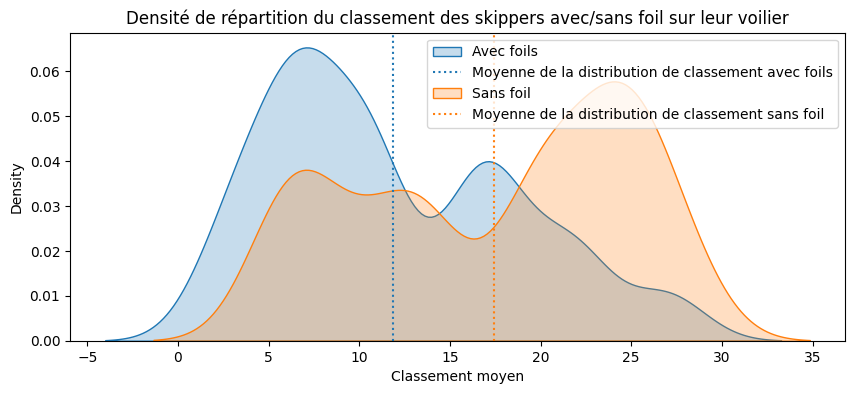

In [31]:
plt.figure(figsize=(10, 4))
sns.kdeplot(foils["Classement moyen"], bw=0.3, label="Avec foils", fill=True)
plt.axvline(x = foils['Classement moyen'].mean(), color = 'C0', label ="Moyenne de la distribution de classement avec foils", linestyle="dotted")
sns.kdeplot(no_foil["Classement moyen"], bw=0.3, label="Sans foil", fill=True)
plt.axvline(x = no_foil['Classement moyen'].mean(), color = 'C1', label ="Moyenne de la distribution de classement sans foil", linestyle="dotted")
plt.title("Densité de répartition du classement des skippers avec/sans foil sur leur voilier")
plt.legend()
plt.show()

Valeurs numériques

In [32]:
print(f"Classement moyen avec foils         : {foils['Classement moyen'].mean():.2f}")
print(f"Classement moyen sans foil          : {no_foil['Classement moyen'].mean():.2f}")
print(f"Ecart-type du classement avec foils : {foils['Classement moyen'].std():.2f}")
print(f"Ecart-type du classement sans foil  : {no_foil['Classement moyen'].std():.2f}")

Classement moyen avec foils         : 11.87
Classement moyen sans foil          : 17.44
Ecart-type du classement avec foils : 6.99
Ecart-type du classement sans foil  : 7.75


On remarque donc, qu'à dispertion similaire, le classement moyen des skippers avec foils est bien inférieur à celui des skippers sans foil !

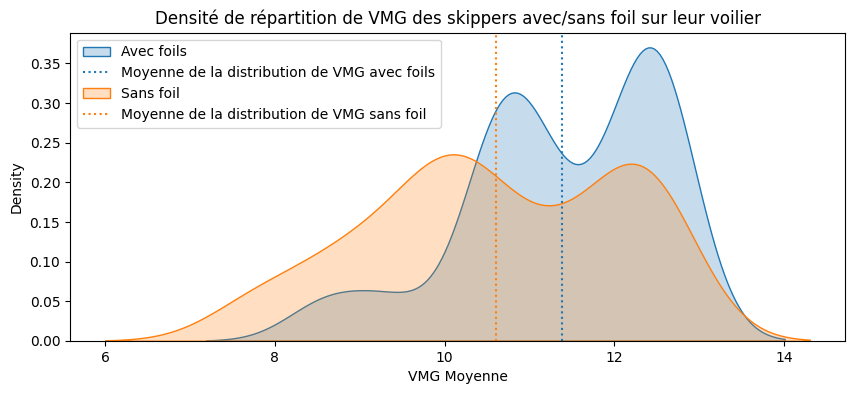

In [33]:
plt.figure(figsize=(10, 4))
sns.kdeplot(foils["VMG Moyenne"], bw=0.4, label="Avec foils", fill=True)
plt.axvline(x = foils["VMG Moyenne"].mean(), color = 'C0', label ="Moyenne de la distribution de VMG avec foils", linestyle="dotted")
sns.kdeplot(no_foil["VMG Moyenne"], bw=0.4, label="Sans foil", fill=True)
plt.axvline(x = no_foil["VMG Moyenne"].mean(), color = 'C1', label ="Moyenne de la distribution de VMG sans foil", linestyle="dotted")
plt.title("Densité de répartition de VMG des skippers avec/sans foil sur leur voilier")
plt.legend(loc="upper left")
plt.show()

In [34]:
print(f"VMG moyenne avec foils          : {foils['VMG Moyenne'].mean():.2f}")
print(f"VMG moyenne sans foil           : {no_foil['VMG Moyenne'].mean():.2f}")
print(f"Ecart-type de la VMG avec foils : {foils['VMG Moyenne'].std():.2f}")
print(f"Ecart-type de la VMG sans foil  : {no_foil['VMG Moyenne'].std():.2f}")

VMG moyenne avec foils          : 11.39
VMG moyenne sans foil           : 10.61
Ecart-type de la VMG avec foils : 1.17
Ecart-type de la VMG sans foil  : 1.51


De même que pour les classements, on remarque donc, qu'à dispertion similaire, la VMG des skippers avec foils est bien supérieure à celle des skippers sans foil !

On peut retrouver ces résultats sur la courbe de comparaison classement / VMG sur le graphe ci-dessous

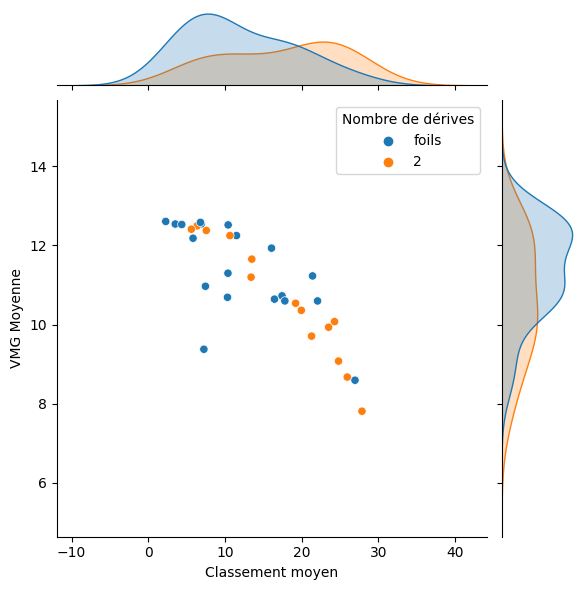

In [35]:
sns.jointplot(data=moyennes_merge_df, x="Classement moyen", y="VMG Moyenne", hue="Nombre de dérives", height=6, kind="scatter")
plt.show()

La présence de foils sur le voilier semble donc bien être un facteur favorisant un bon classement.

### 3.6. Analyses de séries temporelles

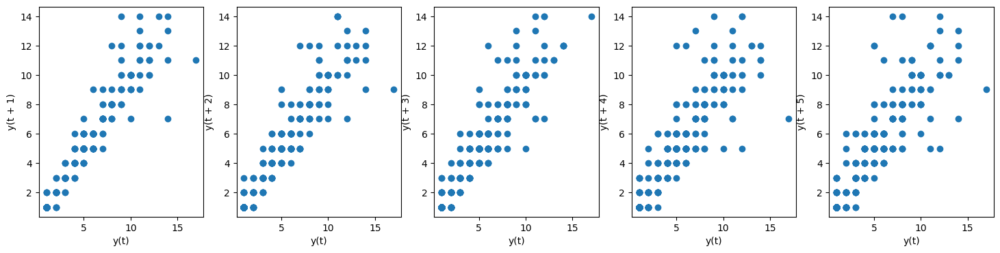

In [36]:
yan = df_running[df_running["Skipper"] == "Yannick Bestaven"]
plt.rcParams['figure.figsize'] = [18, 4]
fig, axs = plt.subplots(1, 5)
pd.plotting.lag_plot(yan["rank"], lag=1, ax=axs[0])
pd.plotting.lag_plot(yan["rank"], lag=2, ax=axs[1])
pd.plotting.lag_plot(yan["rank"], lag=3, ax=axs[2])
pd.plotting.lag_plot(yan["rank"], lag=4, ax=axs[3])
pd.plotting.lag_plot(yan["rank"], lag=5, ax=axs[4])
plt.show()

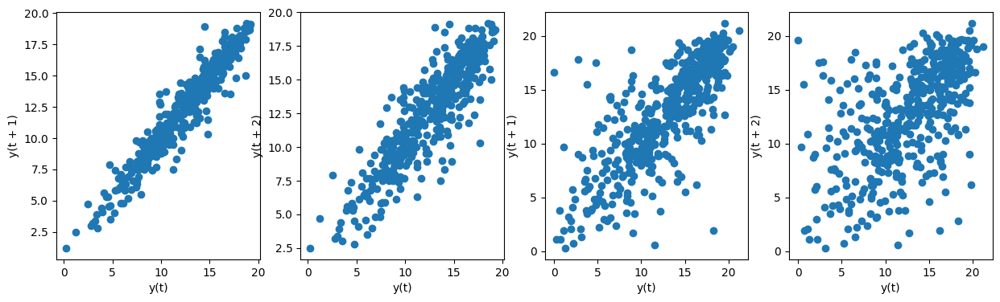

In [37]:
plt.rcParams['figure.figsize'] = [15, 4]
fig, axs = plt.subplots(1, 4)
pd.plotting.lag_plot(yan["last24h_VMG"], lag=1, ax=axs[0])
pd.plotting.lag_plot(yan["last24h_VMG"], lag=2, ax=axs[1])
pd.plotting.lag_plot(yan["lastranking_VMG"], lag=1, ax=axs[2])
pd.plotting.lag_plot(yan["lastranking_VMG"], lag=2, ax=axs[3])
plt.show()

In [38]:
df_skippers = []
for skipper in df_running["Skipper"].unique():
    df_skippers.append(df_running[df_running["Skipper"] == skipper])
for df in df_skippers:
    df.insert(2, "next_rank", "0")
    df["next_rank"] = df["rank"].shift(-1)
    df["rank-1"] = df["rank"].shift(1)
    df["rank-2"] = df["rank"].shift(2)
    df["rank-3"] = df["rank"].shift(3)
    df["rank-4"] = df["rank"].shift(4)
    df["rank-5"] = df["rank"].shift(5)
    df["next_VMG"] = df["last24h_VMG"].shift(-1)

df_timeseries = pd.concat(df_skippers)
df_timeseries = df_timeseries.sort_values(by=["datetime", "rank"], ascending=[True,True], axis=0, ignore_index=True)
df_timeseries

,datetime,rank,next_rank,Voile,Skipper,Bateau,Latitude,Longitude,last30m_Cap,last30m_Vitesse,...,last24h_VMG,last24h_Distance,DTF,DTL,rank-1,rank-2,rank-3,rank-4,rank-5,next_VMG
0,2020-11-08 14:00:00,1.0,8.0,FRA 18,Louis Burton,Bureau Vallée 2,46.407667,-1.841333,241,17.7,...,0.3,6.1,24293.9,0.0,NaN,NaN,NaN,NaN,NaN,1.3
1,2020-11-08 14:00:00,2.0,5.0,MON 10,Boris Herrmann,Seaexplorer - Yacht Club De Monaco,46.405667,-1.830333,241,11.1,...,0.2,6.0,24294.2,0.4,NaN,NaN,NaN,NaN,NaN,1.3
2,2020-11-08 14:00:00,3.0,1.0,FRA 8,Jérémie Beyou,Charal,46.415167,-1.833167,244,15.5,...,0.2,5.5,24294.3,0.5,NaN,NaN,NaN,NaN,NaN,1.4
3,2020-11-08 14:00:00,4.0,4.0,FRA 59,Thomas Ruyant,LinkedOut,46.411833,-1.828000,244,13.2,...,0.2,5.6,24294.5,0.6,NaN,NaN,NaN,NaN,NaN,1.3
4,2020-11-08 14:00:00,5.0,13.0,FRA 53,Maxime Sorel,V And B Mayenne,46.409833,-1.826000,246,10.9,...,0.7,5.8,24294.5,0.6,NaN,NaN,NaN,NaN,NaN,3.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19222,2021-03-05 04:00:00,NaN,NaN,FRA 85,Kevin Escoffier,PRB,NaN,NaN,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19223,2021-03-05 04:00:00,NaN,NaN,FRA 109,Samantha Davies,Initiatives - Coeur,NaN,NaN,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19224,2021-03-05 04:00:00,NaN,NaN,FRA 6,Nicolas Troussel,CORUM L'Épargne,NaN,NaN,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19225,2021-03-05 04:00:00,NaN,NaN,FRA 27,Isabelle Joschke,MACSF,NaN,NaN,,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
unique_skippers = df_running["Skipper"].unique().tolist()
mapping_skip = {}
for i, skipper in enumerate(unique_skippers):
    mapping_skip[skipper] = i
mapping_skip

{'Louis Burton': 0,
 'Boris Herrmann': 1,
 'Jérémie Beyou': 2,
 'Thomas Ruyant': 3,
 'Maxime Sorel': 4,
 'Fabrice Amedeo': 5,
 'Jean Le Cam': 6,
 'Alex Thomson': 7,
 'Sébastien Destremau': 8,
 'Pip Hare': 9,
 'Kevin Escoffier': 10,
 'Stéphane Le Diraison': 11,
 'Romain Attanasio': 12,
 'Damien Seguin': 13,
 'Clément Giraud': 14,
 'Samantha Davies': 15,
 'Yannick Bestaven': 16,
 'Giancarlo Pedote': 17,
 'Kojiro Shiraishi': 18,
 'Nicolas Troussel': 19,
 'Manuel Cousin': 20,
 'Clarisse Cremer': 21,
 'Alan Roura': 22,
 'Didac Costa': 23,
 'Benjamin Dutreux': 24,
 'Armel Tripon': 25,
 'Alexia Barrier': 26,
 'Isabelle Joschke': 27,
 'Sébastien Simon': 28,
 'Miranda Merron': 29,
 'Ari Huusela': 30,
 'Charlie Dalin': 31,
 'Arnaud Boissieres': 32}

Test modèle basé sur classement actuel, VMG sur les dernières 24h et présence/absence de foils

In [40]:
df_model = pd.merge(left=df_timeseries, right=df_boats, left_on="Skipper", right_on="skipper_name", how="left")
df_model = df_model[["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1", "rank", "last24h_VMG", "Nombre de dérives", "next_rank", "next_VMG"]]
df_model  = df_model .rename(columns={"Nombre de dérives": "dérives", "last24h_VMG": "VMG"})
df_model["Skipper"] = df_model["Skipper"].map(mapping_skip)
# fois -> 1, dérives -> 2
df_model = df_model.replace("foils", "1")
df_model = df_model.replace("2 asymétriques", "2")
df_model["dérives"] = pd.to_numeric(df_model["dérives"], errors="coerce").astype(float)
df_model = df_model[df_model["rank"].notna()]
df_model = df_model[df_model["next_rank"].notna()]
df_model["baseline_rank_pred"] = df_model["rank"]
df_model["baseline_VMG_pred"] = df_model["VMG"]
df_model = df_model.dropna().reset_index(drop=True)
df_model

,Skipper,rank-5,rank-4,rank-3,rank-2,rank-1,rank,VMG,dérives,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred
0,6,7.0,19.0,18.0,9.0,2.0,1.0,8.6,2.0,3.0,9.5,1.0,8.6
1,4,5.0,13.0,16.0,16.0,1.0,2.0,8.8,2.0,2.0,9.6,2.0,8.8
2,13,14.0,15.0,17.0,17.0,3.0,3.0,8.7,2.0,1.0,9.5,3.0,8.7
3,11,12.0,21.0,19.0,18.0,9.0,4.0,8.2,1.0,7.0,8.9,4.0,8.2
4,12,13.0,20.0,21.0,22.0,10.0,5.0,8.3,2.0,5.0,9.2,5.0,8.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15069,30,25.0,25.0,25.0,25.0,25.0,25.0,8.7,2.0,25.0,7.9,25.0,8.7
15070,30,25.0,25.0,25.0,25.0,25.0,25.0,7.9,2.0,25.0,7.1,25.0,7.9
15071,30,25.0,25.0,25.0,25.0,25.0,25.0,7.1,2.0,25.0,6.9,25.0,7.1
15072,30,25.0,25.0,25.0,25.0,25.0,25.0,6.9,2.0,25.0,6.9,25.0,6.9


#### 3.6.1. Prédiction classement

In [41]:
X = df_model[["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1", "rank", "VMG", "dérives"]]
y = df_model[["next_rank"]]
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
X_train, y_train = X[:10000], y[:10000]
X_test, y_test = X[10000:], y[10000:]

Baseline score

In [42]:
mse(df_model["next_rank"], df_model["baseline_rank_pred"])

0.4899827517579939

In [43]:
def evaluate_rank_model(model, X_train, X_test, y_train, y_test):
    mod.fit(X_train, y_train)
    y_pred = np.round_(mod.predict(X_test))
    return mse(y_test, y_pred)

In [44]:
models = [LinearRegression(), RidgeCV(), LassoCV(), ElasticNetCV(), DecisionTreeRegressor(),
          GradientBoostingRegressor(), RandomForestRegressor(), AdaBoostRegressor()]
scores = []
for mod in models:
    score = evaluate_rank_model(mod, X_train, X_test, y_train, y_test)
    print(f"{mod.__class__.__name__} : {score}")
    scores.append(score)

LinearRegression : 0.06326369728025226
RidgeCV : 0.06326369728025226
LassoCV : 0.06326369728025226
ElasticNetCV : 0.06326369728025226
DecisionTreeRegressor : 0.550453291288924
GradientBoostingRegressor : 0.07094994087504927
RandomForestRegressor : 0.21009065825778478
AdaBoostRegressor : 2.321048482459598


In [59]:
gradboost = GradientBoostingRegressor()
gradboost.fit(X_train, y_train)
df_model["predicted_rank"] = np.round_(gradboost.predict(X))
df_model

,Skipper,rank-5,rank-4,rank-3,rank-2,rank-1,rank,VMG,dérives,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred,predicted_rank,predicted_VMG
0,6,7.0,19.0,18.0,9.0,2.0,1.0,8.6,2.0,3.0,9.5,1.0,8.6,9.0,9.0
1,4,5.0,13.0,16.0,16.0,1.0,2.0,8.8,2.0,2.0,9.6,2.0,8.8,9.0,9.0
2,13,14.0,15.0,17.0,17.0,3.0,3.0,8.7,2.0,1.0,9.5,3.0,8.7,9.0,9.0
3,11,12.0,21.0,19.0,18.0,9.0,4.0,8.2,1.0,7.0,8.9,4.0,8.2,8.0,8.0
4,12,13.0,20.0,21.0,22.0,10.0,5.0,8.3,2.0,5.0,9.2,5.0,8.3,8.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15069,30,25.0,25.0,25.0,25.0,25.0,25.0,8.7,2.0,25.0,7.9,25.0,8.7,9.0,9.0
15070,30,25.0,25.0,25.0,25.0,25.0,25.0,7.9,2.0,25.0,7.1,25.0,7.9,8.0,8.0
15071,30,25.0,25.0,25.0,25.0,25.0,25.0,7.1,2.0,25.0,6.9,25.0,7.1,7.0,7.0
15072,30,25.0,25.0,25.0,25.0,25.0,25.0,6.9,2.0,25.0,6.9,25.0,6.9,7.0,7.0


In [46]:
# forest = RandomForestRegressor()
# forest.fit(X_train, y_train)
# df_model["predicted_rank"] = np.round_(forest.predict(X))
# df_model

In [47]:
# linreg = LinearRegression()
# linreg.fit(X_train, y_train)
# df_model["predicted_rank"] = np.round_(linreg.predict(X))
# df_model

In [48]:
mse(df_model["next_rank"], df_model["predicted_rank"])

0.3696430940692583

Bien mieux que baseline

#### 3.6.2. Prédiction vitesse

In [49]:
X = df_model[["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1", "rank", "VMG", "dérives"]]
y = df_model[["next_VMG"]]
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
X_train, y_train = X[:10000], y[:10000]
X_test, y_test = X[10000:], y[10000:]

In [50]:
mse(df_model["next_VMG"], df_model["baseline_VMG_pred"])

0.685530051744726

In [51]:
def evaluate_VMG_model(model, X_train, X_test, y_train, y_test):
    mod.fit(X_train, y_train)
    y_pred = mod.predict(X_test)
    return mse(y_test, y_pred)

In [52]:
models = [LinearRegression(), RidgeCV(), LassoCV(), ElasticNetCV(), DecisionTreeRegressor(),
          GradientBoostingRegressor(), RandomForestRegressor(), AdaBoostRegressor()]
scores = []
for mod in models:
    score = evaluate_VMG_model(mod, X_train, X_test, y_train, y_test)
    print(f"{mod.__class__.__name__} : {score}")
    scores.append(score)

LinearRegression : 0.6133202460607347
RidgeCV : 0.6133218909374608
LassoCV : 0.6139283928757139
ElasticNetCV : 0.6139714973552733
DecisionTreeRegressor : 1.3595445954745056
GradientBoostingRegressor : 0.6198393583357502
RandomForestRegressor : 0.765091927513761
AdaBoostRegressor : 0.8147505166608829


In [53]:
# ridge = RidgeCV()
# ridge.fit(X_train, y_train)
# df_model["predicted_VMG"] = ridge.predict(X)
# df_model

In [58]:
gradboost_vmg = GradientBoostingRegressor()
gradboost_vmg.fit(X_train, y_train)
df_model["predicted_VMG"] = np.round_(gradboost_vmg.predict(X))
df_model

,Skipper,rank-5,rank-4,rank-3,rank-2,rank-1,rank,VMG,dérives,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred,predicted_rank,predicted_VMG
0,6,7.0,19.0,18.0,9.0,2.0,1.0,8.6,2.0,3.0,9.5,1.0,8.6,9.0,9.0
1,4,5.0,13.0,16.0,16.0,1.0,2.0,8.8,2.0,2.0,9.6,2.0,8.8,9.0,9.0
2,13,14.0,15.0,17.0,17.0,3.0,3.0,8.7,2.0,1.0,9.5,3.0,8.7,9.0,9.0
3,11,12.0,21.0,19.0,18.0,9.0,4.0,8.2,1.0,7.0,8.9,4.0,8.2,8.0,8.0
4,12,13.0,20.0,21.0,22.0,10.0,5.0,8.3,2.0,5.0,9.2,5.0,8.3,8.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15069,30,25.0,25.0,25.0,25.0,25.0,25.0,8.7,2.0,25.0,7.9,25.0,8.7,9.0,9.0
15070,30,25.0,25.0,25.0,25.0,25.0,25.0,7.9,2.0,25.0,7.1,25.0,7.9,8.0,8.0
15071,30,25.0,25.0,25.0,25.0,25.0,25.0,7.1,2.0,25.0,6.9,25.0,7.1,7.0,7.0
15072,30,25.0,25.0,25.0,25.0,25.0,25.0,6.9,2.0,25.0,6.9,25.0,6.9,7.0,7.0


In [55]:
# forest_vmg = RandomForestRegressor()
# forest_vmg.fit(X_train, y_train)
# df_model["predicted_VMG"] = np.round_(forest_vmg.predict(X))
# df_model

In [56]:
# adaboost = AdaBoostRegressor()
# adaboost.fit(X_train, y_train)
# df_model["predicted_VMG"] = np.round_(adaboost.predict(X))
# df_model

In [60]:
mse(df_model["next_VMG"], df_model["predicted_VMG"])

0.7465085577816106

[//]: <> (Récap : gradientboosting pour prédire le classement, ridge pour prédire la VMG
    -> je test ça en itérant sur les points à partir du milieu du classement)
    
Je prends RandomForest dans les 2 cas pour tester, à voir comment justifier ça après

#### 3.6.3. Prédictions sur plusieurs jours

In [61]:
df_predict = df_timeseries[df_timeseries["datetime"].isin(df_timeseries["datetime"].unique()[:465])]
df_predict = pd.merge(left=df_predict, right=df_boats, left_on="Skipper", right_on="skipper_name", how="left")
df_predict["Skipper"] = df_predict["Skipper"].map(mapping_skip)
# df_predict = df_predict[["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1", "rank", "last24h_VMG", "Latitude", "Longitude", "Nombre de dérives"]]
df_predict = df_predict[["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1", "rank", "last24h_VMG", "Nombre de dérives"]]
df_predict = df_predict.replace("foils", "1")
df_predict = df_predict.replace("2 asymétriques", "2")
df_predict = df_predict.rename(columns={"Nombre de dérives": "dérives", "last24h_VMG": "VMG"})
df_predict["dérives"] = pd.to_numeric(df_predict["dérives"], errors="coerce").astype(float)
df_predict = df_predict.dropna().reset_index(drop=True)
df_predict

,Skipper,rank-5,rank-4,rank-3,rank-2,rank-1,rank,VMG,dérives
0,6,7.0,19.0,18.0,9.0,2.0,1.0,8.6,2.0
1,4,5.0,13.0,16.0,16.0,1.0,2.0,8.8,2.0
2,13,14.0,15.0,17.0,17.0,3.0,3.0,8.7,2.0
3,11,12.0,21.0,19.0,18.0,9.0,4.0,8.2,1.0
4,12,13.0,20.0,21.0,22.0,10.0,5.0,8.3,2.0
...,...,...,...,...,...,...,...,...,...
13108,20,21.0,21.0,21.0,21.0,21.0,21.0,8.6,2.0
13109,14,23.0,22.0,22.0,22.0,22.0,22.0,13.6,2.0
13110,29,22.0,23.0,23.0,23.0,23.0,23.0,12.1,2.0
13111,26,24.0,24.0,24.0,24.0,24.0,24.0,10.6,2.0


On part de 465 points de classement, on va prédire jusqu'à 701 pour comparer avec le résultat final <br>
On commence par prédire 10 points dans le future pour voir

In [62]:
def predict_next(df_predict, model_rank, model_vmg):
    df_skippers = []
    for skipper in df_predict["Skipper"].unique():
        df_skippers.append(df_predict[df_predict["Skipper"] == skipper])

    for df in df_skippers:
        latest = df.iloc[-1][["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1", "rank", "VMG", "dérives"]]
        if np.isnan(df['rank'].iloc[-1]):
            continue
        else:
            next_rank = np.round_(model_rank.predict(latest.to_numpy().reshape(1,-1)))[0]
            next_vmg = model_vmg.predict(latest.to_numpy().reshape(1,-1))[0]
            tmp = pd.DataFrame([[df.iloc[0]["Skipper"], latest["rank-4"], latest["rank-3"], latest["rank-2"],
                                 latest["rank-1"], latest["rank"], next_rank, next_vmg, df.iloc[0]["dérives"]]],
                               columns=["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1",
                                        "rank", "VMG", "dérives"])
            df_predict = pd.concat([df_predict, tmp], ignore_index=True)
    
    return df_predict

In [ ]:
#predict_next(df_predict, forest, adaboost)

In [63]:
t0 = time.time()
for i in range(100):
    df_predict = predict_next(df_predict, gradboost, gradboost_vmg)
t1 = time.time()
print(t1 - t0)
display(df_predict)

5.876227378845215


,Skipper,rank-5,rank-4,rank-3,rank-2,rank-1,rank,VMG,dérives
0,6.0,7.0,19.0,18.0,9.0,2.0,1.0,8.600000,2.0
1,4.0,5.0,13.0,16.0,16.0,1.0,2.0,8.800000,2.0
2,13.0,14.0,15.0,17.0,17.0,3.0,3.0,8.700000,2.0
3,11.0,12.0,21.0,19.0,18.0,9.0,4.0,8.200000,1.0
4,12.0,13.0,20.0,21.0,22.0,10.0,5.0,8.300000,2.0
...,...,...,...,...,...,...,...,...,...
16408,26.0,11.0,11.0,11.0,11.0,11.0,11.0,10.619489,2.0
16409,8.0,-6.0,-6.0,-6.0,-6.0,-6.0,-6.0,-6.444647,2.0
16410,5.0,7.0,7.0,7.0,7.0,7.0,7.0,7.315117,1.0
16411,31.0,14.0,14.0,14.0,14.0,14.0,14.0,14.354112,1.0


In [64]:
df_running["Skipper"].unique()

array(['Louis Burton', 'Boris Herrmann', 'Jérémie Beyou', 'Thomas Ruyant',
       'Maxime Sorel', 'Fabrice Amedeo', 'Jean Le Cam', 'Alex Thomson',
       'Sébastien Destremau', 'Pip Hare', 'Kevin Escoffier',
       'Stéphane Le Diraison', 'Romain Attanasio', 'Damien Seguin',
       'Clément Giraud', 'Samantha Davies', 'Yannick Bestaven',
       'Giancarlo Pedote', 'Kojiro Shiraishi', 'Nicolas Troussel',
       'Manuel Cousin', 'Clarisse Cremer', 'Alan Roura', 'Didac Costa',
       'Benjamin Dutreux', 'Armel Tripon', 'Alexia Barrier',
       'Isabelle Joschke', 'Sébastien Simon', 'Miranda Merron',
       'Ari Huusela', 'Charlie Dalin', 'Arnaud Boissieres'], dtype=object)

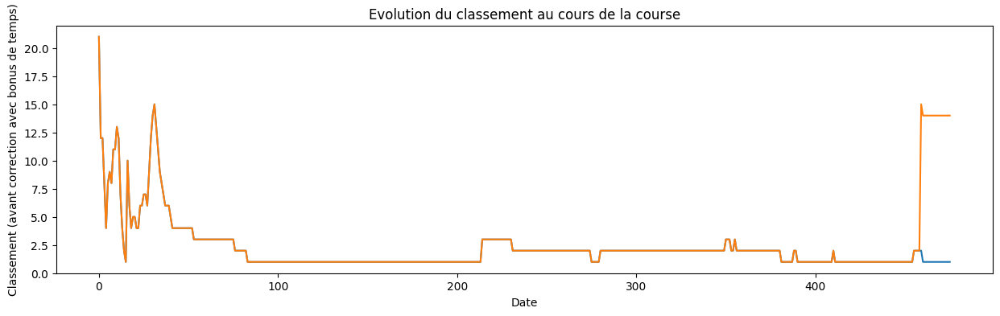

In [65]:
plt.plot(np.arange(476),df_running[df_running["Skipper"] == "Charlie Dalin"]["rank"][6:])
plt.plot(np.arange(476),df_predict[df_predict["Skipper"] == mapping_skip["Charlie Dalin"]]["rank"][:476])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

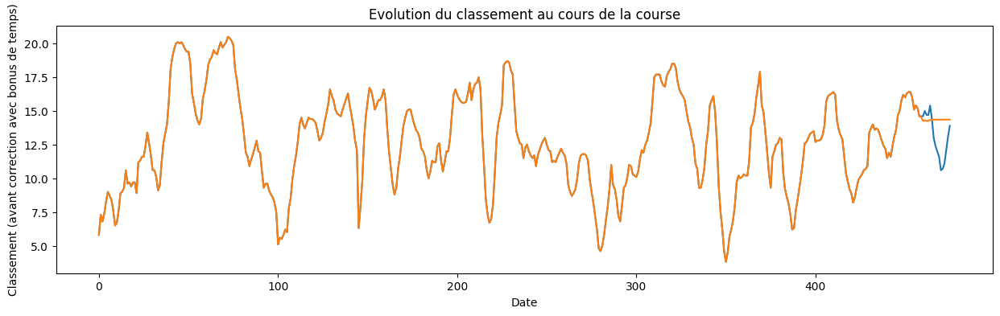

In [66]:
plt.plot(np.arange(476),df_running[df_running["Skipper"] == "Charlie Dalin"]["last24h_VMG"][6:])
plt.plot(np.arange(476),df_predict[df_predict["Skipper"] == mapping_skip["Charlie Dalin"]]["VMG"][:476])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

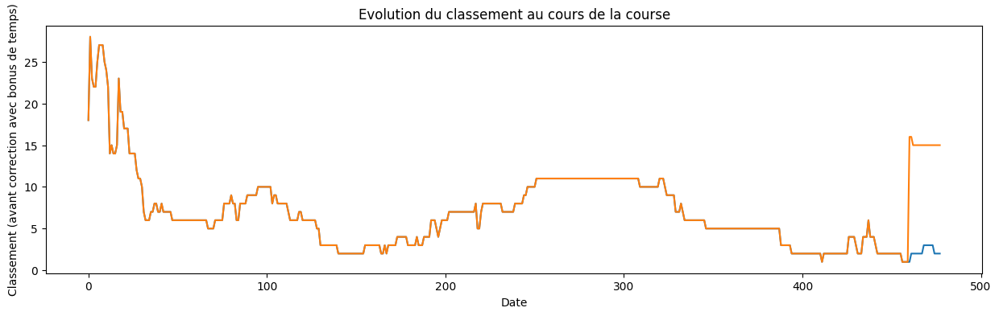

In [67]:
plt.plot(np.arange(478),df_running[df_running["Skipper"] == "Louis Burton"]["rank"][5:])
plt.plot(np.arange(478),df_predict[df_predict["Skipper"] == mapping_skip["Louis Burton"]]["rank"][:478])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

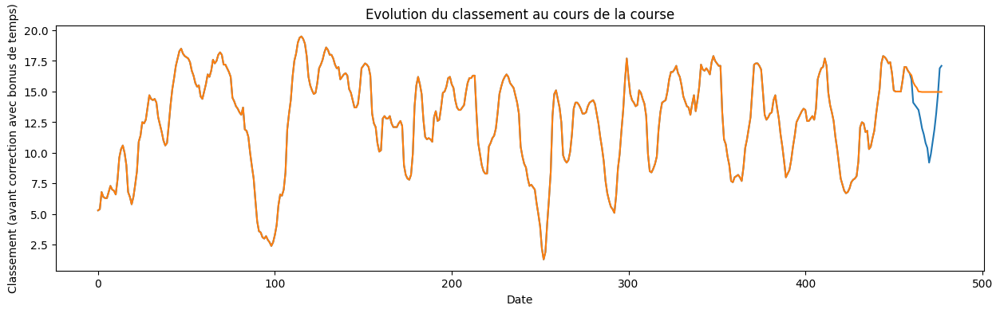

In [68]:
plt.plot(np.arange(478),df_running[df_running["Skipper"] == "Louis Burton"]["last24h_VMG"][5:])
plt.plot(np.arange(478),df_predict[df_predict["Skipper"] == mapping_skip["Louis Burton"]]["VMG"][:478])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

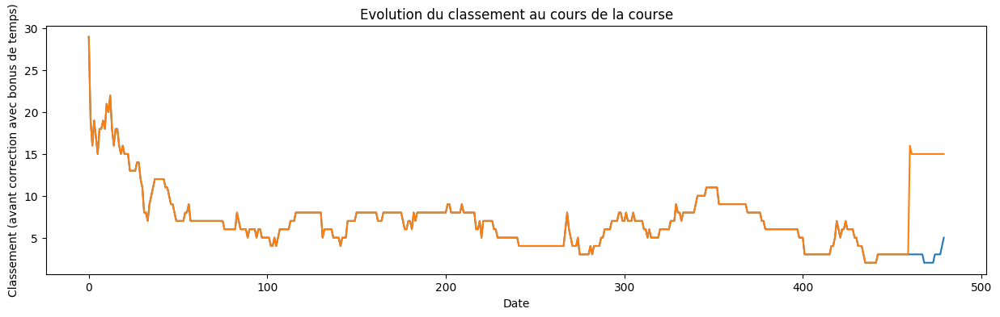

In [69]:
plt.plot(np.arange(480),df_running[df_running["Skipper"] == "Boris Herrmann"]["rank"][5:])
plt.plot(np.arange(480),df_predict[df_predict["Skipper"] == mapping_skip["Boris Herrmann"]]["rank"][:480])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

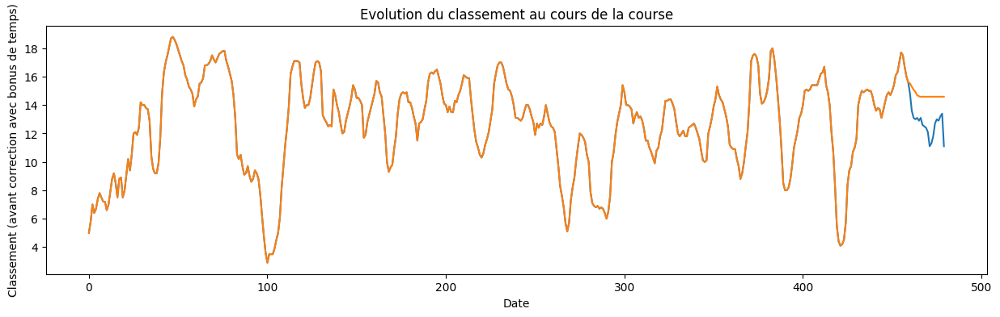

In [70]:
plt.plot(np.arange(480),df_running[df_running["Skipper"] == "Boris Herrmann"]["last24h_VMG"][5:])
plt.plot(np.arange(480),df_predict[df_predict["Skipper"] == mapping_skip["Boris Herrmann"]]["VMG"][:480])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

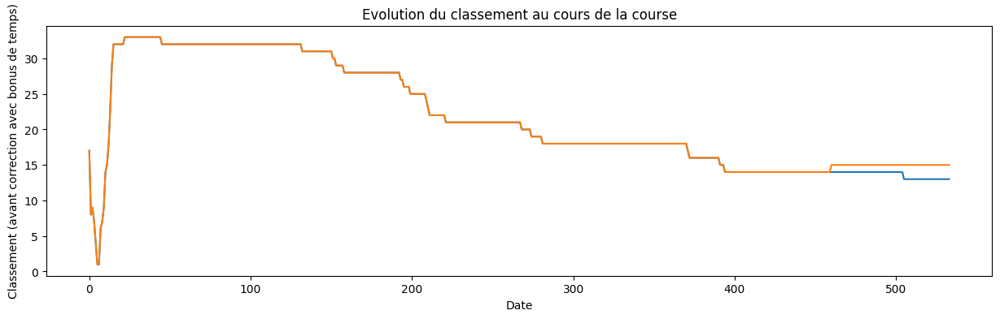

In [71]:
plt.plot(np.arange(534),df_running[df_running["Skipper"] == "Jérémie Beyou"]["rank"][5:])
plt.plot(np.arange(534),df_predict[df_predict["Skipper"] == mapping_skip["Jérémie Beyou"]]["rank"][:534])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

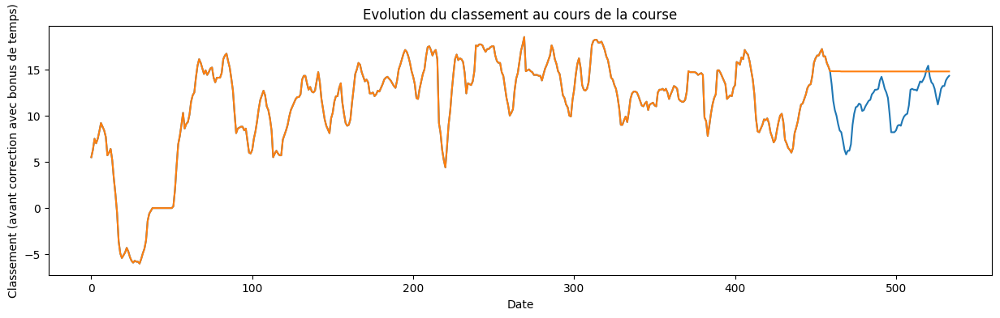

In [72]:
plt.plot(np.arange(534),df_running[df_running["Skipper"] == "Jérémie Beyou"]["last24h_VMG"][5:])
plt.plot(np.arange(534),df_predict[df_predict["Skipper"] == mapping_skip["Jérémie Beyou"]]["VMG"][:534])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

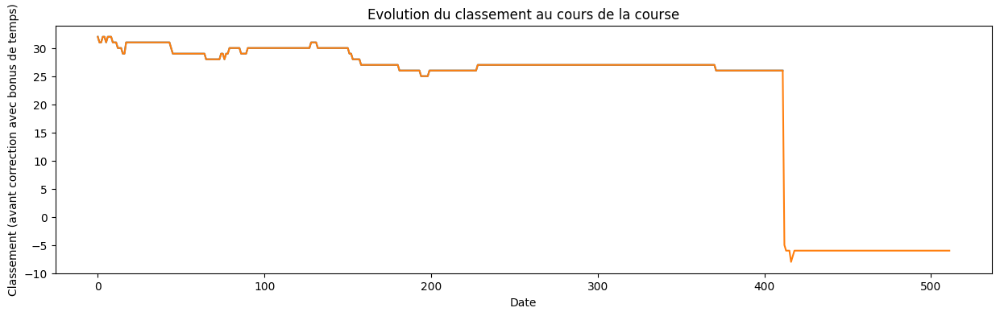

In [73]:
plt.plot(np.arange(512),df_running[df_running["Skipper"] == "Sébastien Destremau"]["rank"][5:517])
plt.plot(np.arange(512),df_predict[df_predict["Skipper"] == mapping_skip["Sébastien Destremau"]]["rank"])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

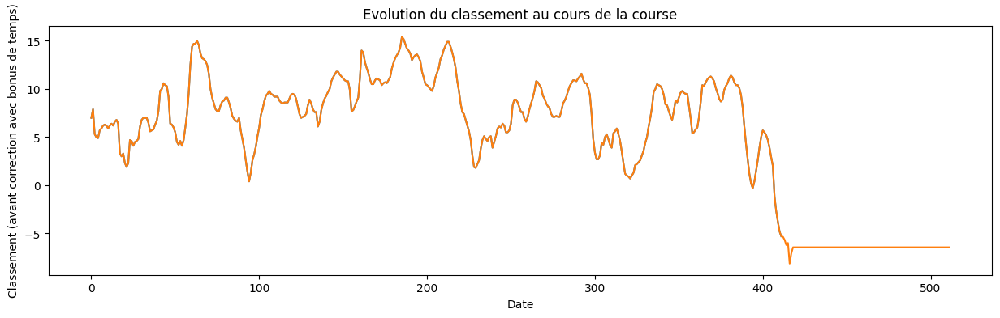

In [74]:
plt.plot(np.arange(512),df_running[df_running["Skipper"] == "Sébastien Destremau"]["last24h_VMG"][5:517])
plt.plot(np.arange(512),df_predict[df_predict["Skipper"] == mapping_skip["Sébastien Destremau"]]["VMG"])
plt.title('Evolution du classement au cours de la course')
plt.xlabel('Date')
plt.ylabel('Classement (avant correction avec bonus de temps)')
plt.show()

In [ ]:
df_timeseries

In [75]:
df_model = pd.merge(left=df_timeseries, right=df_boats, left_on="Skipper", right_on="skipper_name", how="left")
df_model = df_model[["Skipper", "rank-3", "rank-2", "rank-1", "rank", "last24h_VMG", "Nombre de dérives", "next_rank", "next_VMG"]]
df_model  = df_model .rename(columns={"Nombre de dérives": "dérives", "last24h_VMG": "VMG"})
df_model = df_model.replace("2 asymétriques", "2")
df_model = df_model[df_model["rank"].notna()]
df_model = df_model[df_model["next_rank"].notna()]
df_model["baseline_rank_pred"] = df_model["rank"]
df_model["baseline_VMG_pred"] = df_model["VMG"]
df_model = df_model.dropna().reset_index(drop=True)
df_model

,Skipper,rank-3,rank-2,rank-1,rank,VMG,dérives,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred
0,Jérémie Beyou,3.0,1.0,1.0,1.0,5.4,foils,4.0,5.4,1.0,5.4
1,Nicolas Troussel,20.0,6.0,6.0,2.0,5.4,foils,5.0,5.4,2.0,5.4
2,Armel Tripon,26.0,10.0,7.0,3.0,5.3,foils,6.0,5.4,3.0,5.3
3,Thomas Ruyant,4.0,4.0,3.0,4.0,5.2,foils,18.0,4.9,4.0,5.2
4,Alex Thomson,8.0,3.0,4.0,6.0,4.9,foils,19.0,7.9,6.0,4.9
...,...,...,...,...,...,...,...,...,...,...,...
15135,Ari Huusela,25.0,25.0,25.0,25.0,8.7,2,25.0,7.9,25.0,8.7
15136,Ari Huusela,25.0,25.0,25.0,25.0,7.9,2,25.0,7.1,25.0,7.9
15137,Ari Huusela,25.0,25.0,25.0,25.0,7.1,2,25.0,6.9,25.0,7.1
15138,Ari Huusela,25.0,25.0,25.0,25.0,6.9,2,25.0,6.9,25.0,6.9


In [76]:
transformer = make_column_transformer((OneHotEncoder(), ["Skipper", "dérives"]), remainder='passthrough')
transformed = transformer.fit_transform(df_model)
transformed_df = pd.DataFrame(transformed.toarray(), columns=transformer.get_feature_names())
transformed_df

,onehotencoder__x0_Alan Roura,onehotencoder__x0_Alex Thomson,onehotencoder__x0_Alexia Barrier,onehotencoder__x0_Ari Huusela,onehotencoder__x0_Armel Tripon,onehotencoder__x0_Arnaud Boissieres,onehotencoder__x0_Benjamin Dutreux,onehotencoder__x0_Boris Herrmann,onehotencoder__x0_Charlie Dalin,onehotencoder__x0_Clarisse Cremer,...,onehotencoder__x1_foils,rank-3,rank-2,rank-1,rank,VMG,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,3.0,1.0,1.0,1.0,5.4,4.0,5.4,1.0,5.4
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,20.0,6.0,6.0,2.0,5.4,5.0,5.4,2.0,5.4
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,26.0,10.0,7.0,3.0,5.3,6.0,5.4,3.0,5.3
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,4.0,4.0,3.0,4.0,5.2,18.0,4.9,4.0,5.2
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,8.0,3.0,4.0,6.0,4.9,19.0,7.9,6.0,4.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15135,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,25.0,25.0,25.0,25.0,8.7,25.0,7.9,25.0,8.7
15136,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,25.0,25.0,25.0,25.0,7.9,25.0,7.1,25.0,7.9
15137,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,25.0,25.0,25.0,25.0,7.1,25.0,6.9,25.0,7.1
15138,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,25.0,25.0,25.0,25.0,6.9,25.0,6.9,25.0,6.9


#### Rank prediction

In [77]:
cols = ["next_rank", "next_VMG", "baseline_rank_pred", "baseline_VMG_pred"]
X = transformed_df.drop(cols, axis=1)
y = transformed_df[["next_rank"]]
X_train, y_train = X[:10000], y[:10000]
X_test, y_test = X[10000:], y[10000:]

In [78]:
def evaluate_rank_model(model, X_train, X_test, y_train, y_test):
    mod.fit(X_train, y_train)
    y_pred = np.round_(mod.predict(X_test))
    return accuracy(y_test, y_pred)

In [79]:
linreg, ridge, lasso, elasticnet = LinearRegression(), RidgeCV(), LassoCV(), ElasticNetCV()
dt_tree, gboost, forest, adaboost =  DecisionTreeRegressor(), GradientBoostingRegressor(), RandomForestRegressor(), AdaBoostRegressor()
models = [linreg, ridge, lasso, elasticnet, dt_tree, gboost, forest, adaboost]
scores = []
for mod in models:
    score = evaluate_rank_model(mod, X_train, X_test, y_train, y_test)
    print(f"{mod.__class__.__name__} : {score}")
    scores.append(score)

LinearRegression : 0.9007782101167315
RidgeCV : 0.9173151750972762
LassoCV : 0.9464980544747081
ElasticNetCV : 0.9464980544747081
DecisionTreeRegressor : 0.7498054474708171
GradientBoostingRegressor : 0.906420233463035
RandomForestRegressor : 0.8272373540856031
AdaBoostRegressor : 0.21848249027237354


In [80]:
transformed_df["predicted_rank"] = np.round_(dt_tree.predict(X))
transformed_df

,onehotencoder__x0_Alan Roura,onehotencoder__x0_Alex Thomson,onehotencoder__x0_Alexia Barrier,onehotencoder__x0_Ari Huusela,onehotencoder__x0_Armel Tripon,onehotencoder__x0_Arnaud Boissieres,onehotencoder__x0_Benjamin Dutreux,onehotencoder__x0_Boris Herrmann,onehotencoder__x0_Charlie Dalin,onehotencoder__x0_Clarisse Cremer,...,rank-3,rank-2,rank-1,rank,VMG,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred,predicted_rank
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,1.0,1.0,1.0,5.4,4.0,5.4,1.0,5.4,4.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.0,6.0,6.0,2.0,5.4,5.0,5.4,2.0,5.4,5.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,26.0,10.0,7.0,3.0,5.3,6.0,5.4,3.0,5.3,6.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,4.0,3.0,4.0,5.2,18.0,4.9,4.0,5.2,18.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.0,3.0,4.0,6.0,4.9,19.0,7.9,6.0,4.9,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15135,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,25.0,8.7,25.0,7.9,25.0,8.7,25.0
15136,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,25.0,7.9,25.0,7.1,25.0,7.9,26.0
15137,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,25.0,7.1,25.0,6.9,25.0,7.1,26.0
15138,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,25.0,6.9,25.0,6.9,25.0,6.9,26.0


In [81]:
print(f"Score on prediction : {accuracy(transformed_df['next_rank'], transformed_df['predicted_rank'])}")
print(f"Score on baseline : {accuracy(transformed_df['next_rank'], transformed_df['baseline_rank_pred'])}")
print(f"Score on baseline : {accuracy(transformed_df['predicted_rank'], transformed_df['baseline_rank_pred'])}")

Score on prediction : 0.9042932628797886
Score on baseline : 0.8723249669749009
Score on baseline : 0.819220607661823


#### Speed prediction

In [82]:
cols = ["next_rank", "next_VMG", "baseline_rank_pred", "baseline_VMG_pred"]
X = transformed_df.drop(cols, axis=1)
y = transformed_df[["next_VMG"]]
X_train, y_train = X[:10000], y[:10000]
X_test, y_test = X[10000:], y[10000:]

In [83]:
def evaluate_VMG_model(model, X_train, X_test, y_train, y_test):
    mod.fit(X_train, y_train)
    y_pred = mod.predict(X_test)
    return mse(y_test, y_pred)

In [84]:
models = [linreg, ridge, lasso, elasticnet, dt_tree, gboost, forest, adaboost]
scores = []
for mod in models:
    score = evaluate_VMG_model(mod, X_train, X_test, y_train, y_test)
    print(f"{mod.__class__.__name__} : {score}")
    scores.append(score)

LinearRegression : 0.6170626224472643
RidgeCV : 0.6171803423013086
LassoCV : 0.6162378685244205
ElasticNetCV : 0.6164013141628581
DecisionTreeRegressor : 1.3635441668541606
GradientBoostingRegressor : 0.6279016864356292
RandomForestRegressor : 0.7826078676609467
AdaBoostRegressor : 0.912383871408969


In [85]:
transformed_df["predicted_VMG"] = forest.predict(X)
transformed_df

,onehotencoder__x0_Alan Roura,onehotencoder__x0_Alex Thomson,onehotencoder__x0_Alexia Barrier,onehotencoder__x0_Ari Huusela,onehotencoder__x0_Armel Tripon,onehotencoder__x0_Arnaud Boissieres,onehotencoder__x0_Benjamin Dutreux,onehotencoder__x0_Boris Herrmann,onehotencoder__x0_Charlie Dalin,onehotencoder__x0_Clarisse Cremer,...,rank-2,rank-1,rank,VMG,next_rank,next_VMG,baseline_rank_pred,baseline_VMG_pred,predicted_rank,predicted_VMG
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,5.4,4.0,5.4,1.0,5.4,4.0,5.470000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.0,6.0,2.0,5.4,5.0,5.4,2.0,5.4,5.0,5.510000
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,10.0,7.0,3.0,5.3,6.0,5.4,3.0,5.3,6.0,5.566000
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,3.0,4.0,5.2,18.0,4.9,4.0,5.2,18.0,4.994000
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,4.0,6.0,4.9,19.0,7.9,6.0,4.9,19.0,6.510500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15135,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,8.7,25.0,7.9,25.0,8.7,25.0,8.800664
15136,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,7.9,25.0,7.1,25.0,7.9,26.0,8.022083
15137,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,7.1,25.0,6.9,25.0,7.1,26.0,7.084000
15138,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25.0,25.0,25.0,6.9,25.0,6.9,25.0,6.9,26.0,6.861917


In [86]:
print(f"Score on prediction : {mse(transformed_df['next_VMG'], transformed_df['predicted_VMG'])}")
print(f"Score on baseline : {mse(transformed_df['next_VMG'], transformed_df['baseline_VMG_pred'])}")

Score on prediction : 0.39862375586886256
Score on baseline : 0.6997708058124175


In [ ]:
def predict_next(df_predict, model_rank, model_vmg):
    test = transformer.transform(df_model.iloc[-1].to_frame().T).toarray()
    df_skippers = []
    for skipper in df_predict["Skipper"].unique():
        df_skippers.append(df_predict[df_predict["Skipper"] == skipper])

    for df in df_skippers:
        latest = df.iloc[-1]
        if np.isnan(df['rank'].iloc[-1]):
            continue
        else:
            next_rank = np.round_(model_rank.predict(latest.to_numpy().reshape(1,-1)))[0]
            next_vmg = model_vmg.predict(latest.to_numpy().reshape(1,-1))[0]
            tmp = pd.DataFrame([[df.iloc[0]["Skipper"], latest["rank-4"], latest["rank-3"], latest["rank-2"],
                                 latest["rank-1"], latest["rank"], next_rank, next_vmg, df.iloc[0]["dérives"]]],
                               columns=["Skipper", "rank-5", "rank-4", "rank-3", "rank-2", "rank-1",
                                        "rank", "VMG", "dérives"])
            df_predict = pd.concat([df_predict, tmp], ignore_index=True)
    
    return df_predict

In [ ]:
df_predict = X_train.copy()
t0 = time.time()
for i in range(100):
    df_predict = predict_next(df_predict, dt_tree, forest)
t1 = time.time()
print(t1 - t0)
display(df_predict)

In [ ]:
from statsmodels.discrete.conditional_models import ConditionalLogit
import numpy as np

g = np.kron(np.arange(100), np.ones(5)).astype(int)
x = np.random.normal(size=500)
pr = 1 / (1 + np.exp(-x))
y = (np.random.uniform(size=500) < pr).astype(int)

m = ConditionalLogit(endog=y, exog=x, groups=g)
r = m.fit()